<a href="https://colab.research.google.com/github/Gus-1003/ISD_invention_Human_Brain_Signals/blob/main/Working_Memory_N-back_Analisys/analise_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise de Sinais Eletrofisiologicos - Eletroencefalografia (EEG) - Foco: Memoria de Trabalho - Protocolo: N-back

## informações sobre o grupo:

Projeto desenvolvido durante a disciplina "Transdução e Processamento de Sinais Biológicos" no semestre 2023.2, ministrada pelo professor-pesquisador Deniz Delisle Rodriguez (http://lattes.cnpq.br/7140331839822423), referente ao Programa de Mestrado em Neuroengenharia do Instituto Internacional de Neurociência Edmund e Lily Safra (IIN-ELS).

Link da Instituição: https://www.institutosantosdumont.org.br/

O grupo responsável por esta pesquisa é composto pelos seguintes discentes:

Airton Mateus Dantas Andrade
Ana Alice da Silva Campos
Gustavo Gonçalves Maciel
Ingrid Gomes Queiroz
Esta pesquisa não é um trabalho autoral; todo o protocolo e base teórica foram extraídos de pesquisas recentes que envolviam o estudo da memória de trabalho em modelos humanos. Todas as referências utilizadas no trabalho podem ser encontradas no link disponível logo abaixo:

Referências da pesquisa: https://drive.google.com/drive/folders/1nC_lYBrX1gdmd2NvDgal4We0TU8lha2a?usp=sharing

## Introdução a Pesquisa - Memória de Trabalho - Protocolo N-back

Aspectos Gerais do Experimento:

População e Amostra:

* A pesquisa foi conduzida nas dependências do Instituto Santos Dumont (ISD) em uma sala reservada.
* Esta atividade é caracterizada como disciplinar, estando isenta da avaliação do Conselho de Ética.
* O tamanho da amostra (N-amostral) foi de 2 participantes.
* O recrutamento dos participantes foi realizado por conveniência.

Materiais:

* Foram utilizados 16 canais durante a coleta de dados.
* O dispositivo de coleta empregado foi o Amplificador V-Amp da Brain Products.
* A colocação dos eletrodos seguiu o templete da Toca, baseado no sistema 10-20.
* Os softwares utilizados para a condução da pesquisa foram o Openvibe e o Psychopy.

Protocolo do Experimento:

O teste N-back é uma tarefa cognitiva frequentemente utilizada para avaliar a memória de trabalho, que é a capacidade de reter temporariamente e manipular informações mentais. No teste N-back, os participantes são apresentados a uma série de estímulos, no caso desse projeto, letras, e são instruídos a indicar se o estímulo atual é idêntico ao que ocorreu N etapas atrás na sequência.


* O Teste N-back apresentado nesse trabalho apresenta 3 fases, possuindo em cada fase uma versão "pratica" e a versão "teste". Todo o protocolo durante em torno de 15 a 25min para ser realizado:

    * 1-back: Neste teste, os participantes são apresentados a uma sequência de letras que servirão como estimulos. A tarefa é verificar se o estímulo atual é idêntico ao que ocorreu imediatamente antes, ou seja, apenas um passo atrás na sequência. Exemplo: Se a sequência for A, B, C, D, E, o participante deve indicar se o estímulo "B" é igual ao estímulo imediatamente anterior "A".

    * 2-back: Neste caso, os participantes precisam comparar o estímulo atual com o que ocorreu dois passos atrás na sequência. Continuando o exemplo anterior, se a sequência for A, B, C, D, E, o participante deve verificar se o estímulo "C" é igual ao estímulo ocorrido dois passos atrás "A".

    * 3-back: Aqui, a demanda cognitiva aumenta, pois os participantes devem lembrar e comparar o estímulo atual com o que ocorreu três passos atrás na sequência. Utilizando o mesmo exemplo, se a sequência for A, B, C, D, E, o participante precisa determinar se o estímulo "D" é igual ao estímulo ocorrido três passos atrás "A".

# Código:

## Importando bibliotecas e modulos:

In [ ]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 37.8 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns # Visualização de dados
from numpy.fft import fft

from sklearn.preprocessing import MinMaxScaler

from scipy import signal
from scipy.signal import find_peaks
from scipy.signal import coherence
from scipy.signal import butter,cheby1,bessel,ellip,iirnotch,filtfilt # Filtros
from scipy.signal import welch

import pywt
import mne # Manipulação e Visualização de dados neurofisiológicos

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/MyDrive/

Mounted at /content/drive/
/content/drive/MyDrive


## Funções:

In [ ]:
def extrair_eventos(dataframe, id_evento, janela):
    index_eventos = dataframe[dataframe['Event Id'] == id_evento].index
    eventos = []
    protocolo = 1
    n_janela = 0

    for i, indice_atual in enumerate(index_eventos):
        duracao_evento = index_eventos[i+1] - indice_atual if i+1 < len(index_eventos) else len(dataframe) - indice_atual

        if duracao_evento == janela or duracao_evento > janela:
            evento = dataframe.loc[indice_atual:indice_atual+janela-1].copy()
            evento["n_back"] = protocolo
            evento["n_janela"] = i
            eventos.append(evento)
            if duracao_evento > janela:
                protocolo += 1
        elif duracao_evento < janela:
            evento = dataframe.loc[indice_atual:indice_atual+duracao_evento-1].copy()
            evento["n_back"] = protocolo
            evento["n_janela"] = i
            eventos.append(evento)
    return eventos

In [ ]:
def extrair_eventos_clicados(dataframe, id_evento, janela):
    index_eventos = dataframe[dataframe['Event Id'] == id_evento].index
    eventos = []
    protocolo = 1
    n_janela = 0

    for i, indice_atual in enumerate(index_eventos):
        duracao_evento = index_eventos[i+1] - indice_atual if i+1 < len(index_eventos) else len(dataframe) - indice_atual

        if duracao_evento == janela or duracao_evento > janela:
            evento = dataframe.loc[indice_atual:indice_atual+janela-1].copy()
            evento["n_back"] = protocolo
            evento["n_janela"] = i
            #eventos.append(evento)
            if duracao_evento > janela:
                protocolo += 1
        elif duracao_evento < janela:
            n_janela += 1
            evento = dataframe.loc[indice_atual:indice_atual+duracao_evento-1].copy()
            evento["n_back"] = protocolo
            evento["n_janela"] = i
            eventos.append(evento)
            print(f'Dentro do protocolo {protocolo}: indice {i}')

    return eventos

In [ ]:
def plot_psd_per_channel(data, fs=512):
    """
    Plota o gráfico de densidade espectral de potência (PSD) para cada canal do dataset.

    Args:
    - data (DataFrame): DataFrame contendo os dados dos canais.
    - fs (int): Frequência de amostragem em Hz (padrão: 512 Hz).

    Returns:
    - None
    """
    plt.figure(figsize=(12, 8))
    for idx, column in enumerate(data.columns):
        signal = data[column]
        f, Pxx = plt.psd(signal, Fs=fs, NFFT=512)
        plt.figure(figsize=(8, 4))
        plt.plot(f, Pxx)
        plt.xlabel('Frequência [Hz]')
        plt.ylabel('Densidade Espectral de Potência [dB/Hz]')
        plt.title(f'PSD - Canal {column}')
        plt.grid(True)
        plt.show()

In [ ]:
def min_max_normalization(data, feature_range=(0, 1)):
    """
    Normaliza os dados em um DataFrame para o intervalo Min-Max especificado.

    Args:
    - data (DataFrame): DataFrame contendo os dados a serem normalizados.
    - feature_range (tuple): Intervalo desejado para a normalização (padrão: (0, 1)).

    Returns:
    - DataFrame: DataFrame normalizado.
    """
    min_value = data.min()
    max_value = data.max()
    normalized_data = (data - min_value) / (max_value - min_value)
    scaled_data = normalized_data * (feature_range[1] - feature_range[0]) + feature_range[0]
    return scaled_data

In [ ]:
def CAR_filter(eeg_dataframe, channes):
  """
  Entradas
  -eeg_dataframe: sinal de EEG de todos os canais

  Saídas
  -eeg_car: sinal de EEG de todos os canais re-referenciados
  """
  noise = eeg_dataframe.mean(1).to_numpy()
  eeg_car = eeg_dataframe.to_numpy() - noise.reshape((-1,1))
  eeg_car = pd.DataFrame(eeg_car,columns=channes)
  return eeg_car

In [ ]:
def bandpass_filter(signal,N=3,f_low=4,f_high=7,Fs=512,filter_type='butter',max_ripple=3):
  """
  Entradas
  -signal: sinal de EEG
  -N: ordem do filtro
  -f_low: frequência mínima do passa-banda
  -f_high: frequência máxima do passa-banda
  -Fs: frequência de amostragem
  -filter_type: tipo do filtro (butterworth, chebyshev, elíptico ou bessel)
  -max_ripple: ripple máximo para os filtros chebyshev e elípticos

  Saídas
  -filtered: array do sinal filtrado no formato [tempo,]
  """
  match filter_type:
    case 'butter':
      b,a = butter(N,[f_low,f_high],'bandpass',fs=Fs)
    case 'cheby':
      b,a = cheby1(N,max_ripple,[f_low,f_high],'bandpass',fs=Fs)
    case 'bessel':
      b,a = bessel(N,[f_low,f_high],'bandpass',fs=Fs,norm='mag')
    case 'ellip':
      b,a = ellip(N,max_ripple,max_ripple,[f_low,f_high],'bandpass',fs=Fs)

  filtered = filtfilt(b,a,signal,axis=0)
  return filtered

In [ ]:
def plot_eeg_data(data, time):
    """
    Plota os dados EEG em um gráfico de subplots.

    Args:
    - data (DataFrame): DataFrame contendo os dados EEG.
    - time (array): Array de tempo correspondente aos dados EEG.

    Returns:
    - None
    """
    plt.figure(figsize=(25, 18))

    for idx, column in enumerate(data.columns):
        plt.subplot(4, 4, idx + 1)
        plt.plot(time, data[column])
        plt.xlabel('Time[s]')
        plt.ylabel('Voltage[uV]')
        plt.title(column)

    plt.tight_layout()
    plt.show()

In [ ]:
def comparar_sinais(data1, data2, signal_channels, time):
    """
    Compara coluna a coluna os valores de dois DataFrames e plota os gráficos lado a lado.

    Args:
    - data1 (DataFrame): Primeiro DataFrame a ser comparado.
    - data2 (DataFrame): Segundo DataFrame a ser comparado.
    - time (array): Array de tempo correspondente aos dados.

    Returns:
    - None
    """
    fig, axs = plt.subplots(4, 4, figsize=(25, 15))
    fig.suptitle('Comparação de Valores por Canal')

    for idx, signal_channels in enumerate(signal_channels):
        ax = axs[idx // 4, idx % 4]
        ax.plot(time, data1[signal_channels], label='dado')
        ax.plot(time, data2[signal_channels], label='Filtered')
        ax.set_xlabel('Time[s]')
        ax.set_ylabel('Voltage[uV]')
        ax.set_title(signal_channels)
        ax.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_time(raw_signals, taxa_amostragem):
    """
    Calcula o array de tempo com base no comprimento do DataFrame e na taxa de amostragem.

    Args:
    - raw_signals (DataFrame): DataFrame contendo os sinais.
    - taxa_amostragem (int): Taxa de amostragem dos sinais em Hz.

    Returns:
    - array: Array de tempo correspondente aos sinais.
    """
    num_linhas = len(raw_signals)
    time = np.arange(0, num_linhas / taxa_amostragem, 1 / taxa_amostragem)
    return time

In [ ]:
def calculate_energy(data):
    """
    Calcula a energia de cada canal nos dados EEG.

    Args:
    - data (DataFrame): DataFrame contendo os dados EEG.

    Returns:
    - DataFrame: DataFrame contendo a energia de cada canal.
    """
    N = data.shape[-1]
    eeg_sqrd = data.apply(np.square)  # Elevar todos os pontos ao quadrado
    eeg_power = eeg_sqrd.sum(axis=0)  # Soma todos os valores em cada coluna
                                       # (calcula a energia de cada canal)
    eeg_power = eeg_power.apply(lambda x: x / (2 * N + 1))  # Divide a energia de cada
                                                            # canal por 2N+1
    return eeg_power

## Variáveis Importantes para o Código:

In [ ]:
columns_to_remove = ['Aux 1', 'Aux 2',  'Event Date', 'Event Duration', 'Epoch', 'Time:512Hz']

map_columns_names = {
    'Channel 1': 'AF3',
    'Channel 2': 'F3',
    'Channel 3': 'F8',
    'Channel 4': 'T7',
    'Channel 5': 'FC5',
    'Channel 6': 'P3',
    'Channel 7': 'P7',
    'Channel 8': 'O1',
    'Channel 9': 'AF4',
    'Channel 10': 'F4',
    'Channel 11': 'F7',
    'Channel 12': 'T8',
    'Channel 13': 'FC6',
    'Channel 14': 'P4',
    'Channel 15': 'P8',
    'Channel 16': 'O2',
    'Event Id': 'Event Id'
}

sorting_columns = ["AF3", "AF4", "F7", "F3", "F4", "F8", "FC5", "FC6", "T7", "T8", "P7", "P3", "P4", "P8", "O1", "O2", "Event Id"]

signal_channels = ["AF3", "AF4", "F7", "F3", "F4", "F8", "FC5", "FC6", "T7", "T8", "P7", "P3", "P4", "P8", "O1", "O2"]

map_event_id = {33043.0: 1, 33040.0: 2, 33042.0: 3}

duration_event = 2 # segundos
freqs = 512 # Amostragem do sinal
length_event_in_dataset = duration_event * freqs

## Caminhos dos dados:

In [ ]:
caminho_arquivo = "/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/Analise_Dados/Registros_Openvibe_recoleta/Coleta1_Airton.csv"
#caminho_arquivo = "/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/Analise_Dados/Registros_Openvibe_recoleta/Coleta2_Gustavo.csv"
#caminho_arquivo = "/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/Analise_Dados/Registro_Openvibe_Dezembro/record-[2023.12.21-11.05.43].csv"

## Leitura do caminho:

In [ ]:
# Lendo o arquivo
raw_data = pd.read_csv(caminho_arquivo)

# Removendo colunas indesejadas, renomeando as colunas dos canais, ordenando os sensores pelas posições
raw_data = raw_data.drop(columns=columns_to_remove).rename(columns=map_columns_names)[sorting_columns]

# Renomeando os Eventos
raw_data['Event Id'] = raw_data['Event Id'].replace(map_event_id)

# Plotando um novo dataset dos canais
raw_data

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,Event Id
0,-28093.263672,-14079.444336,-8086.475098,21584.767578,8159.473145,32343.703125,514.550842,-1351.171997,8024.414551,862.353577,-4013.086182,-2115.674072,77.294930,-5333.447754,-2128.613525,-4913.428223,NaN
1,-28084.914062,-14075.196289,-8083.203613,21590.285156,8163.672363,32352.345703,515.869202,-1337.744263,8015.771973,814.404358,-4011.181885,-2110.205322,76.855476,-5332.373535,-2130.810791,-4914.941895,NaN
2,-28081.740234,-14067.432617,-8072.266113,21591.359375,8169.092285,32347.755859,512.695374,-1328.222778,8011.182129,822.265686,-4015.136963,-2115.429932,83.154305,-5329.199707,-2131.836182,-4912.549316,NaN
3,-28078.810547,-14068.750977,-8074.707520,21595.656250,8166.992676,32353.322266,514.550842,-1334.228638,8023.047363,835.253967,-4020.605713,-2113.037354,86.425789,-5327.881348,-2130.029541,-4903.418457,NaN
4,-28079.591797,-14069.532227,-8078.906738,21596.925781,8167.139160,32353.126953,518.066467,-1339.111450,8021.387207,835.986389,-4026.074463,-2110.254150,81.591805,-5330.420410,-2132.031494,-4904.736816,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-25015.871094,-13687.452148,-7070.508301,25742.384766,8931.543945,36778.859375,-2137.842041,-1148.632935,8267.383789,1092.920044,-3174.414307,-3934.717041,19.140627,-6097.559082,-3454.883057,-4571.973145,NaN
328700,-24997.755859,-13677.784180,-7059.521973,25749.806641,8940.577148,36791.261719,-2146.972900,-1151.367310,8279.786133,1092.138794,-3182.763916,-3932.129150,24.365236,-6091.602051,-3454.931885,-4570.654785,NaN
328701,-25011.281250,-13679.883789,-7069.531738,25745.656250,8940.625977,36781.156250,-2137.597900,-1135.644653,8297.217773,1071.826294,-3179.297119,-3934.814697,27.294924,-6099.268066,-3467.138916,-4575.537598,NaN
328702,-25004.689453,-13689.112305,-7089.551270,25747.902344,8931.348633,36782.816406,-2120.849854,-1135.302856,8305.518555,1076.269653,-3188.183838,-3935.010010,28.613283,-6104.590332,-3474.365479,-4566.406738,NaN


## Segmentando Eventos Clicados:

In [ ]:
protocolo_1 = pd.read_csv("/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/eventos_sequencia_letras/n_back1.csv")
protocolo_2 = pd.read_csv("/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/eventos_sequencia_letras/n_back2.csv")
protocolo_3 = pd.read_csv("/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/eventos_sequencia_letras/n_back3.csv")

eventos_concat = pd.concat([protocolo_1, protocolo_2, protocolo_3])
eventos_concat['reacao'] = eventos_concat['reacao'].replace("['space']", 1).fillna(0)
eventos_concat = eventos_concat.reset_index(drop=True)
eventos_concat.head(10)

,letraspratica,reacao
0,B,0.0
1,B,1.0
2,R,0.0
3,S,0.0
4,J,0.0
5,J,1.0
6,C,0.0
7,R,0.0
8,R,1.0
9,M,0.0


In [ ]:
unique_events = eventos_concat["letraspratica"].value_counts()
unique_events

letraspratica
C    23
B    20
J    18
M    18
R    16
H    11
S     8
Name: count, dtype: int64

In [ ]:
# Agora vamos selecionar os índices onde a coluna 'reacao' tem valor 1
indices_com_1 = eventos_concat[eventos_concat['reacao'] == 1].index

# Exibir os índices onde 'reacao' tem valor 1
print(indices_com_1)
print(len(indices_com_1))

Index([  1,   5,   8,  10,  14,  16,  19,  21,  24,  28,  31,  34,  39,  42,
        44,  47,  48,  51,  55,  59,  62,  66,  69,  72,  78,  79,  80,  86,
        87,  91,  94,  99, 104, 106, 110, 111],
      dtype='int64')
36


### seleção do evento que será analisado:

In [ ]:
current_event = 8 # Dataset de um evento especifico (O valor vai de 0 - 113)

## Gerando datasets - Baselines e Eventos

In [ ]:
# Vendo a quantidade de eventos unicos no dataset - 116 eventos - 114 estimulos / 2 baselines
unique_events = raw_data["Event Id"].value_counts()

# Selecionando o indice que indica o inicio de cada evento
marcador_baseline_close = raw_data[raw_data['Event Id'] == 1].index[0]
marcador_baseline_open = raw_data[raw_data['Event Id'] == 2].index[0]
marcador_start_eventos = raw_data[raw_data['Event Id'] == 3].index

In [ ]:
# Gerando o dataset dos baselines
df_baseline_close = raw_data.loc[marcador_baseline_close:marcador_baseline_open-1]
df_baseline_open = raw_data.loc[marcador_baseline_open:marcador_baseline_open+len(df_baseline_close)-1]

In [ ]:
# df_baseline_close = df_baseline_close.reset_index(drop=True)
# df_baseline_close

In [ ]:
# df_baseline_open = df_baseline_open.reset_index(drop=True)
# df_baseline_open

In [ ]:
# Gerando uma lista onde cada indice é o dataset de um evento
eventos_extraidos = extrair_eventos(raw_data, id_evento=3, janela=length_event_in_dataset)

In [ ]:
# Concatenar os DataFrames da lista ao longo das linhas
eventos_stim = pd.concat(eventos_extraidos)
eventos_stim

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,Event Id,n_back,n_janela
132096,-27041.701172,-14208.301758,-7882.861816,23871.437500,8282.569336,34689.503906,-942.431702,-1366.601685,7932.275879,781.738342,-4151.709473,-2850.244385,17.871096,-5665.283691,-2535.693604,-4871.582520,3.0,1,0
132097,-27031.642578,-14204.151367,-7880.420410,23880.714844,8288.916992,34697.855469,-936.767639,-1358.886841,7936.182129,786.767639,-4143.457520,-2844.482666,27.783205,-5657.861816,-2531.347900,-4858.936035,NaN,1,0
132098,-27032.423828,-14203.077148,-7875.537598,23879.982422,8289.600586,34699.417969,-936.230530,-1349.560669,7917.480957,802.148499,-4149.707520,-2844.775635,24.853518,-5650.977051,-2533.496338,-4862.988770,NaN,1,0
132099,-27024.416016,-14197.608398,-7879.736816,23889.699219,8292.530273,34710.207031,-922.119202,-1355.517700,7933.789551,794.873108,-4159.326660,-2854.297119,27.050783,-5647.900879,-2535.498291,-4859.375488,NaN,1,0
132100,-27032.521484,-14202.100586,-7875.049316,23882.472656,8292.676758,34695.902344,-934.423889,-1360.791138,7928.760254,797.412170,-4157.764160,-2850.195557,21.777346,-5652.930176,-2523.193604,-4857.861816,NaN,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318459,-25148.195312,-13712.891602,-7105.762207,25645.949219,8900.928711,36581.496094,-2074.267822,-1117.578247,8195.801758,1163.671997,-3175.635010,-3892.138916,15.673829,-6029.395020,-3364.795166,-4586.084473,NaN,3,113
318460,-25153.224609,-13713.819336,-7102.100098,25639.992188,8897.608398,36573.636719,-2081.787354,-1126.855591,8196.143555,1170.117310,-3175.195557,-3893.945557,8.984376,-6030.908691,-3365.185791,-4596.777832,NaN,3,113
318461,-25146.437500,-13709.278320,-7095.898926,25640.919922,8903.321289,36577.199219,-2072.070557,-1122.851685,8198.243164,1157.666138,-3179.101807,-3896.240479,9.375001,-6035.303223,-3363.525635,-4589.844238,NaN,3,113
318462,-25158.791016,-13711.036133,-7092.773926,25638.380859,8902.588867,36566.847656,-2095.312744,-1123.339966,8191.797363,1149.804810,-3180.322510,-3896.289307,6.933594,-6035.596191,-3367.383057,-4598.437988,NaN,3,113


In [ ]:
eventos_clicados_extraidos = extrair_eventos_clicados(raw_data, id_evento=3, janela=length_event_in_dataset)

# Concatenar os DataFrames da lista ao longo das linhas
eventos_clicados = pd.concat(eventos_clicados_extraidos, ignore_index=True)

# Agora você tem um único DataFrame combinado
eventos_clicados

Dentro do protocolo 1: indice 5
Dentro do protocolo 1: indice 10
Dentro do protocolo 1: indice 16
Dentro do protocolo 1: indice 21
Dentro do protocolo 1: indice 24
Dentro do protocolo 1: indice 31
Dentro do protocolo 2: indice 42
Dentro do protocolo 2: indice 51
Dentro do protocolo 2: indice 68
Dentro do protocolo 3: indice 78
Dentro do protocolo 3: indice 79
Dentro do protocolo 3: indice 86
Dentro do protocolo 3: indice 108


,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,Event Id,n_back,n_janela
0,-26930.470703,-14168.702148,-7866.797363,23939.845703,8310.694336,34759.718750,-986.816467,-1347.558716,7934.961426,808.984436,-4170.703613,-2902.588135,7.275391,-5669.092285,-2544.092041,-4890.527832,3.0,1,5
1,-26926.857422,-14168.702148,-7874.609863,23942.580078,8308.350586,34762.160156,-980.908264,-1347.705200,7951.514160,811.621155,-4164.111816,-2904.248291,12.646485,-5654.834473,-2547.558838,-4879.785645,NaN,1,5
2,-26921.681641,-14163.526367,-7878.906738,23953.322266,8307.813477,34769.093750,-972.509827,-1350.146606,7943.359863,801.953186,-4152.002441,-2903.320557,9.863282,-5663.037598,-2555.566650,-4884.912598,NaN,1,5
3,-26916.408203,-14164.795898,-7873.096191,23948.439453,8309.522461,34769.093750,-990.673889,-1346.338013,7934.375488,777.636780,-4179.541504,-2917.334229,12.353517,-5674.219238,-2561.718994,-4886.768066,NaN,1,5
4,-26918.800781,-14163.086914,-7874.561035,23954.054688,8313.184570,34763.234375,-986.767639,-1333.838013,7939.990723,772.412170,-4171.777832,-2910.986572,13.281251,-5669.873535,-2549.609619,-4891.357910,NaN,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6651,-25183.742188,-13723.926758,-7128.467285,25604.347656,8879.981445,36511.527344,-2076.953369,-1132.812622,8153.516113,1100.000122,-3203.125244,-3876.513916,16.699221,-6009.863770,-3324.072510,-4606.348145,NaN,3,108
6652,-25180.666016,-13724.366211,-7128.320801,25608.693359,8882.813477,36509.378906,-2071.142822,-1134.765747,8158.984863,1106.445435,-3200.097900,-3877.636963,18.652346,-6015.234863,-3333.545166,-4611.426270,NaN,3,108
6653,-25187.990234,-13728.809570,-7133.643066,25605.763672,8876.124023,36515.675781,-2066.260010,-1141.211060,8168.359863,1131.591919,-3192.285400,-3873.633057,10.986329,-6015.771973,-3331.689697,-4608.740723,NaN,3,108
6654,-25199.611328,-13732.666992,-7132.080566,25594.533203,8874.659180,36505.277344,-2081.201416,-1144.629028,8136.377441,1136.328247,-3181.299072,-3869.140869,10.058595,-6020.801270,-3335.547119,-4615.527832,NaN,3,108


In [ ]:
current_data = eventos_extraidos[current_event].iloc[:, 0:16]
protocol_type = eventos_extraidos[current_event].iloc[1, 17]
n_event = eventos_extraidos[current_event].iloc[1, 18]

current_data = current_data.reset_index(drop=True)

print(f"Este é o evento {n_event} de 114, faz parte do procolo N-Back_{protocol_type}")
current_data

Este é o evento 8 de 114, faz parte do procolo N-Back_1


,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2
0,-26899.171875,-14152.735352,-7833.887207,23981.593750,8330.225586,34806.546875,-963.281311,-1323.925903,7967.041504,850.439514,-4105.908691,-2895.996338,30.712893,-5659.326660,-2539.209229,-4889.795410
1,-26889.259766,-14141.602539,-7821.387207,23988.478516,8338.477539,34809.230469,-962.500061,-1311.377075,7974.365723,869.189514,-4127.148926,-2897.949463,39.453129,-5644.824707,-2541.797119,-4890.283691
2,-26879.152344,-14140.333008,-7820.166504,23995.412109,8336.426758,34815.726562,-960.595764,-1308.007935,7990.674316,859.326233,-4137.207520,-2905.859619,36.083988,-5648.779785,-2545.556885,-4898.242676
3,-26875.880859,-14138.916992,-7823.437988,24000.539062,8338.916992,34825.296875,-961.962952,-1308.252075,7992.383301,820.214905,-4125.098145,-2896.191650,31.787111,-5640.918457,-2539.013916,-4889.893066
4,-26871.291016,-14142.823242,-7829.346191,24000.880859,8338.624023,34828.664062,-949.316467,-1310.302856,8010.791504,810.888733,-4114.404785,-2900.342041,34.814457,-5642.676270,-2546.386963,-4890.527832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1019,-26859.767578,-14149.708008,-7837.695801,23994.582031,8319.629883,34818.265625,-976.074280,-1314.306763,7959.229004,847.851624,-4106.299316,-2893.603760,45.605473,-5634.229004,-2518.603760,-4875.830566
1020,-26864.748047,-14145.801758,-7830.811035,23988.917969,8319.532227,34814.750000,-976.171936,-1313.183716,7950.391113,865.722717,-4093.750244,-2894.336182,39.355473,-5644.727051,-2525.390869,-4884.326660
1021,-26864.455078,-14147.754883,-7835.937988,23990.089844,8316.993164,34821.535156,-987.158264,-1320.459106,7931.836426,821.728577,-4100.146973,-2888.818604,39.355473,-5645.117676,-2532.129150,-4879.346191
1022,-26876.222656,-14146.680664,-7834.521973,23982.521484,8320.313477,34804.886719,-984.716858,-1315.918091,7927.148926,808.496155,-4102.051270,-2886.670166,42.578129,-5642.090332,-2516.601807,-4881.396973


## Análise Exploratoria dos dados:

In [ ]:
# Analise do dataset bruto:
raw_signals = raw_data.iloc[:, 0:16].copy()

# Analise do baseline_close:
# raw_signals = df_baseline_close.iloc[5100:5100+1024, 0:16].copy()
# raw_signals

# Analise do baseline_open:
# raw_signals = df_baseline_open.iloc[5100:5100+1024, 0:16].copy()
# raw_signals

# Analise de 1 evento especifico:
# raw_signals = current_data.copy()
# raw_signals

# Analise de todos os eventos clicados:
# raw_signals = eventos_clicados.iloc[:, 0:16].copy()
# raw_signals

### Removendo o Baseline:

In [ ]:
baseline_means = df_baseline_open.iloc[:, 0:16].mean(axis=0)

# Criando uma lista para armazenar os sinais após remover a linha de base
eventos_corrigidos = []

# Loop para processar cada evento e remover a linha de base
for evento in eventos_extraidos:
    # Subtraindo a linha de base do evento para os primeiros 16 canais (assumindo que esses são os canais de interesse)
    evento_corrigido = evento.iloc[:, 0:16] - baseline_means
    # Adicionando o evento corrigido à lista
    eventos_corrigidos.append(evento_corrigido)

# Convertendo a lista de eventos corrigidos de volta para um DataFrame
df_eventos_corrigidos = pd.concat(eventos_corrigidos)

raw_signals_norm = min_max_normalization(df_eventos_corrigidos)
eeg_car = CAR_filter(raw_signals_norm, signal_channels)
raw_signals_filtered = eeg_car.apply(bandpass_filter,f_low=4,f_high=7)
result = raw_signals_filtered.join(eventos_stim[['n_back', 'n_janela']], how='left')
result

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,n_back,n_janela
0,-0.002188,-0.003277,-0.003572,-0.002150,-2.398287e-03,-0.001532,-0.001124,-0.002979,0.014529,0.005118,-0.003917,-0.001858,0.006621,0.000511,-0.004515,0.002730,NaN,NaN
1,-0.002547,-0.003383,-0.003898,-0.002522,-2.501336e-03,-0.001873,-0.001377,-0.002609,0.015020,0.004961,-0.004402,-0.002309,0.007898,0.000962,-0.004775,0.003355,NaN,NaN
2,-0.002898,-0.003475,-0.004208,-0.002885,-2.595460e-03,-0.002209,-0.001626,-0.002228,0.015443,0.004779,-0.004867,-0.002752,0.009151,0.001413,-0.005013,0.003970,NaN,NaN
3,-0.003237,-0.003552,-0.004501,-0.003238,-2.680252e-03,-0.002537,-0.001871,-0.001838,0.015795,0.004573,-0.005309,-0.003184,0.010374,0.001861,-0.005227,0.004571,NaN,NaN
4,-0.003564,-0.003614,-0.004776,-0.003578,-2.755343e-03,-0.002855,-0.002109,-0.001441,0.016076,0.004346,-0.005728,-0.003603,0.011561,0.002304,-0.005418,0.005155,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110075,0.000057,-0.000016,-0.000054,0.000034,4.357807e-07,0.000105,0.000080,-0.000041,0.000141,-0.000045,-0.000046,-0.000021,-0.000049,-0.000054,-0.000066,-0.000028,NaN,NaN
110076,0.000051,-0.000014,-0.000048,0.000030,1.509435e-07,0.000093,0.000072,-0.000038,0.000125,-0.000040,-0.000041,-0.000018,-0.000040,-0.000048,-0.000059,-0.000025,NaN,NaN
110077,0.000045,-0.000012,-0.000042,0.000026,-7.688338e-08,0.000081,0.000063,-0.000034,0.000110,-0.000035,-0.000037,-0.000016,-0.000032,-0.000042,-0.000053,-0.000022,NaN,NaN
110078,0.000039,-0.000011,-0.000037,0.000023,-2.515933e-07,0.000070,0.000055,-0.000031,0.000096,-0.000031,-0.000033,-0.000014,-0.000025,-0.000037,-0.000046,-0.000020,NaN,NaN


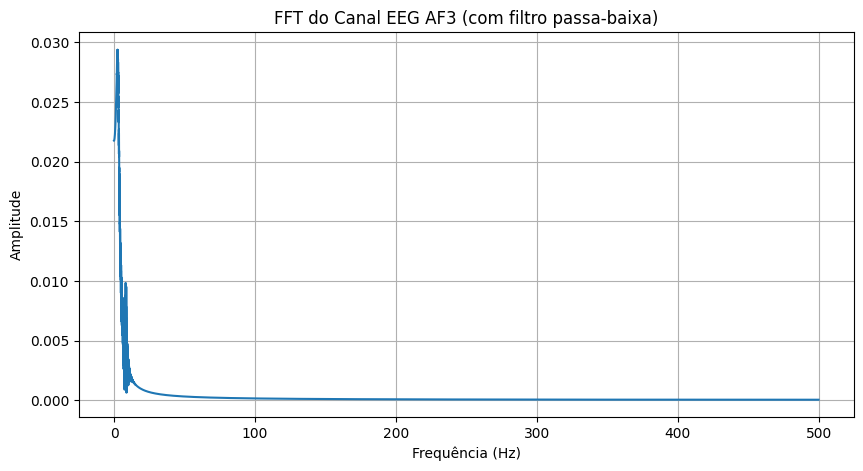

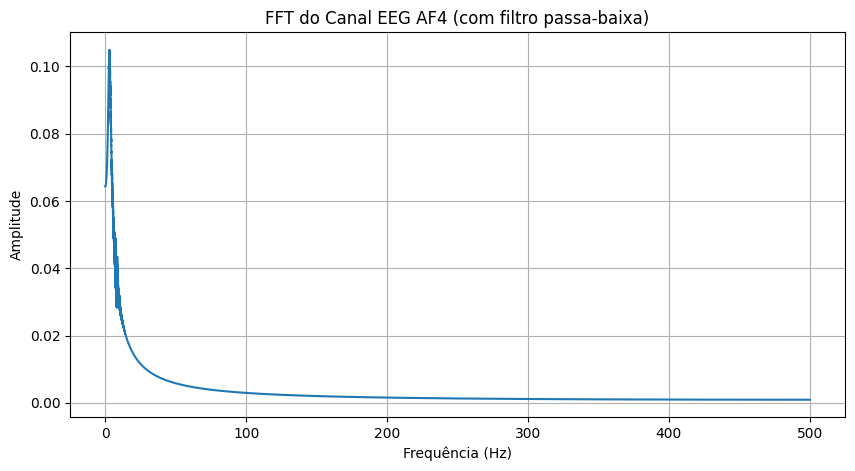

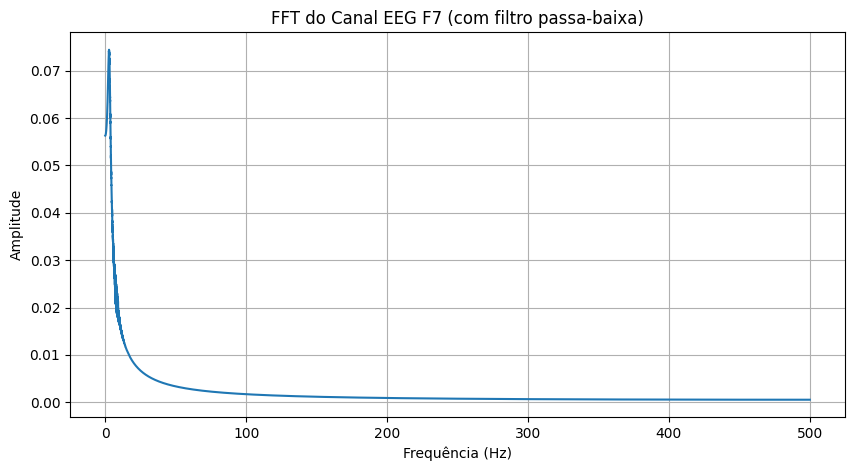

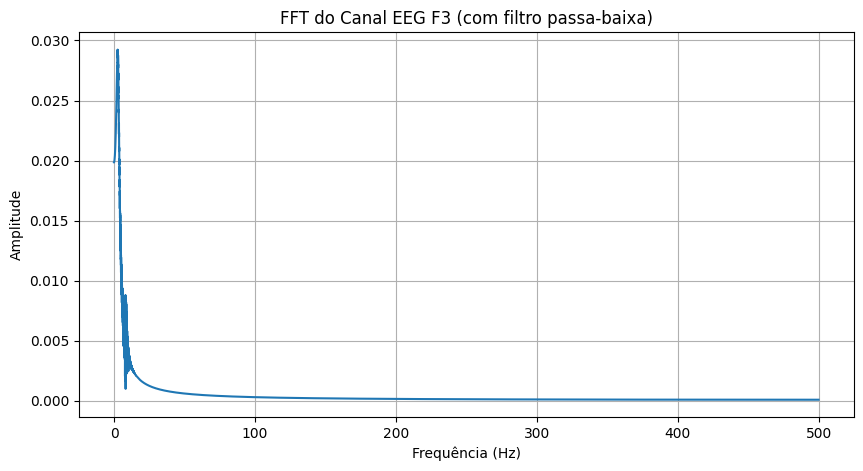

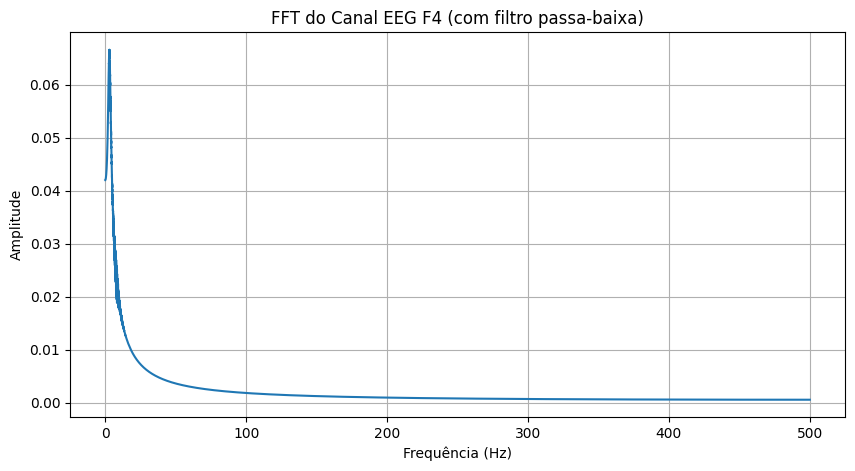

...

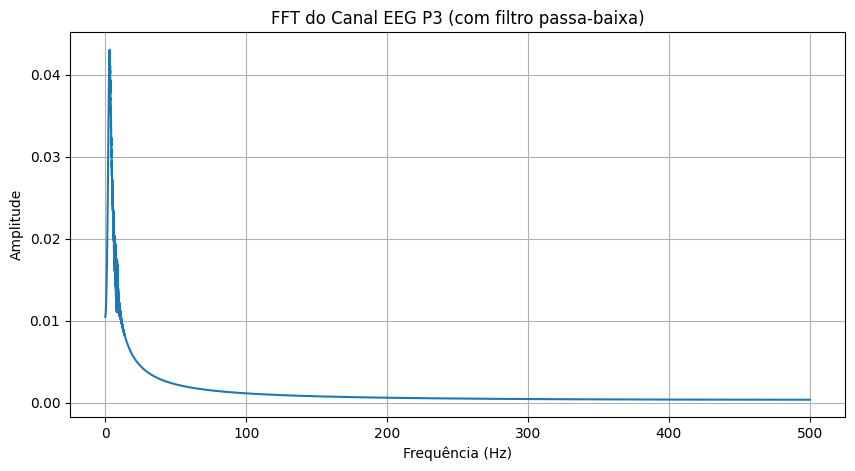

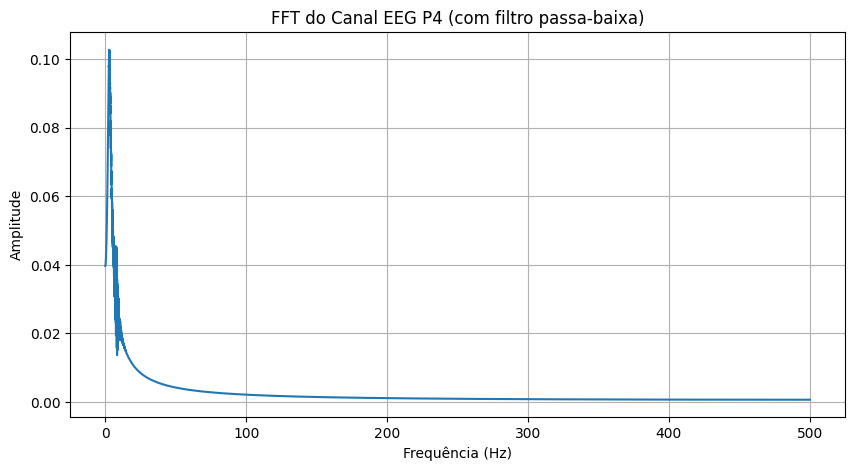

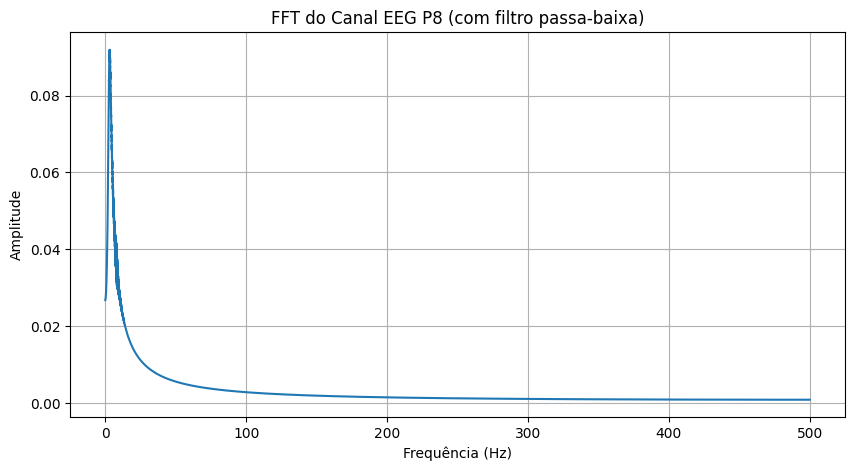

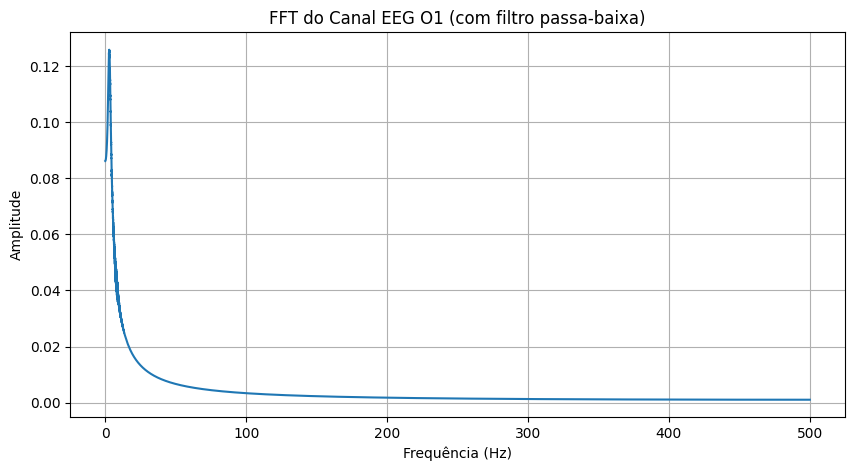

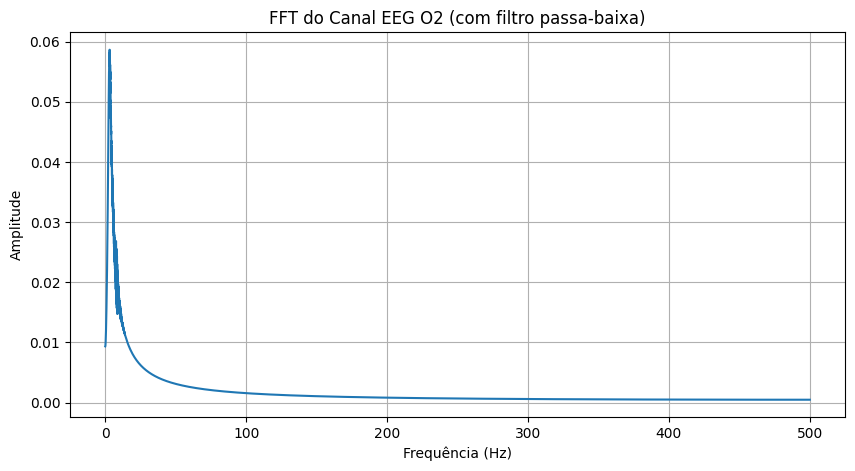

In [ ]:
fs = 1000  # Suponha uma frequência de amostragem de 1000 Hz
N = len(raw_signals_norm)  # Número de pontos no sinal (supondo que cada linha representa um ponto de dados)
freqs = np.fft.fftfreq(N, 1/fs)  # Frequências correspondentes aos coeficientes do FFT

# Aplicar filtro passa-baixa para remover o ruído de baixa frequência
cutoff_freq = 3  # Frequência de corte do filtro em Hz
b, a = butter(4, cutoff_freq / (fs / 2), 'low')  # Projeta o filtro passa-baixa
for canal in signal_channels:
    sinal_filtrado = filtfilt(b, a, result[canal])

    # Calcular o FFT e plotar o espectro de frequência do sinal filtrado
    fft_values = np.fft.fft(sinal_filtrado)
    fft_abs = np.abs(fft_values)  # Obtenha o valor absoluto do FFT para representar o espectro

    plt.figure(figsize=(10, 5))
    plt.plot(freqs[:N//2], fft_abs[:N//2])  # Apenas plote as frequências positivas
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Amplitude')
    plt.title(f'FFT do Canal EEG {canal} (com filtro passa-baixa)')
    plt.grid(True)
    plt.show()

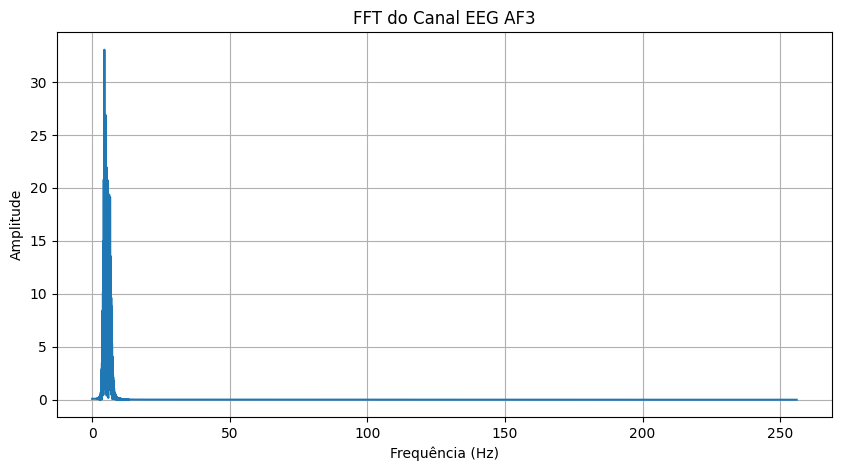

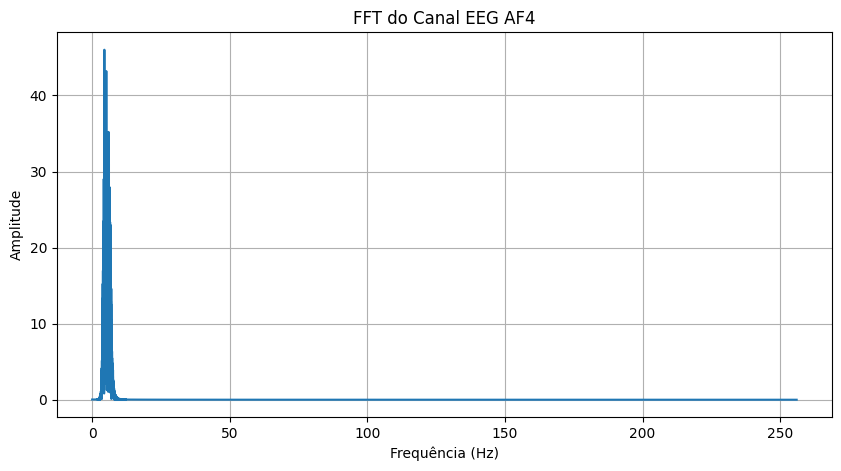

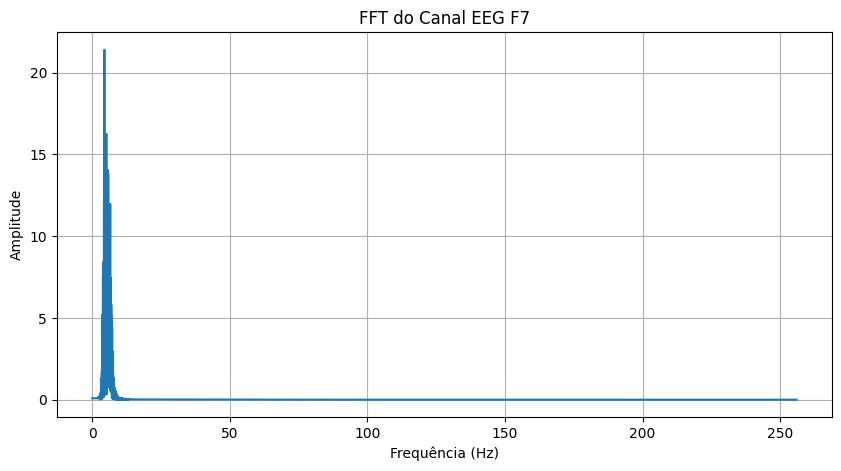

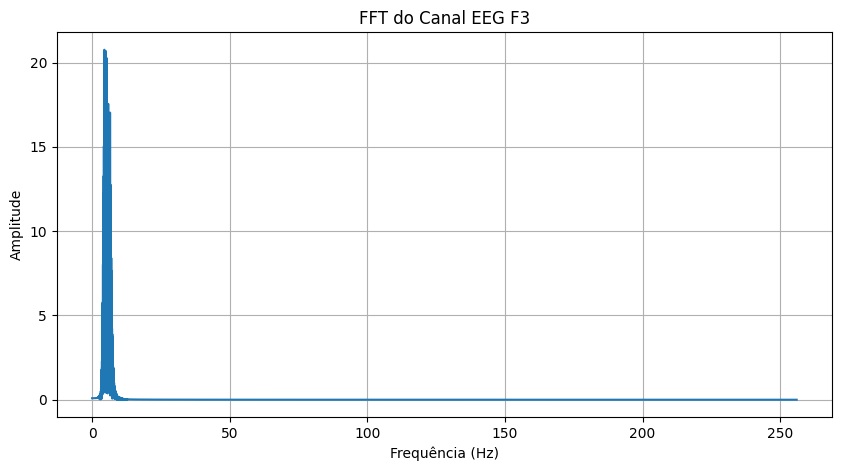

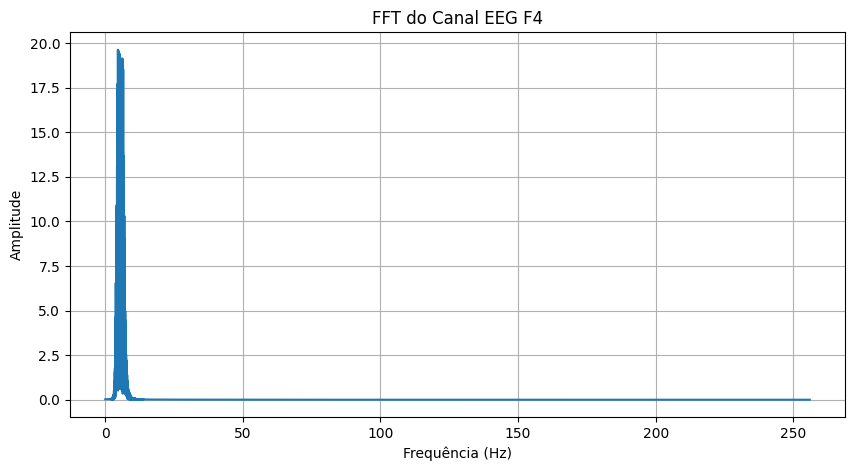

...

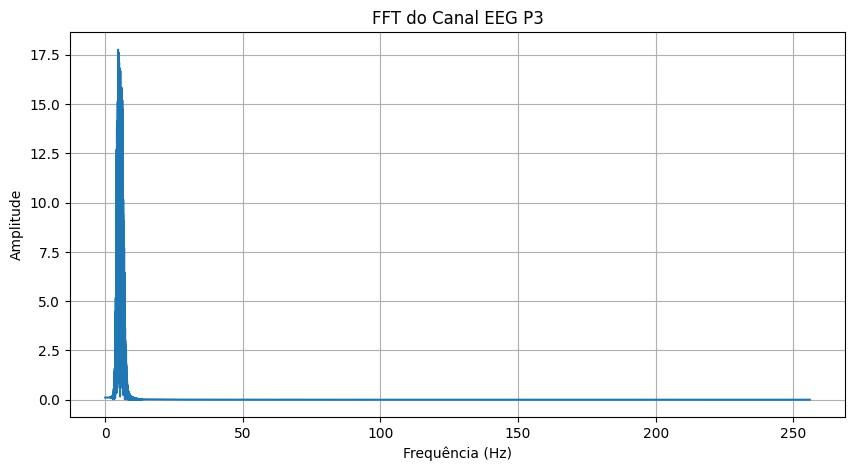

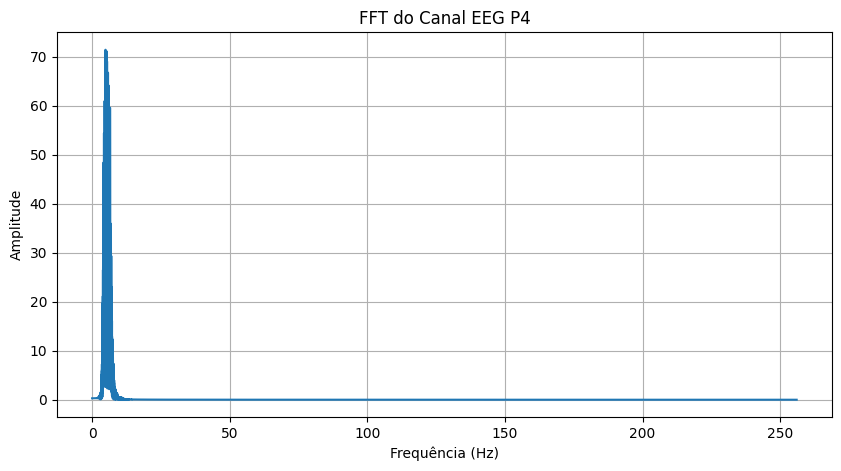

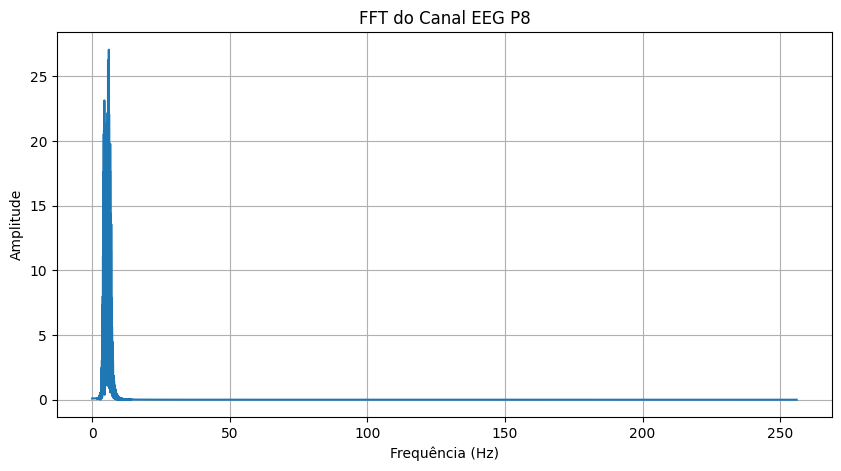

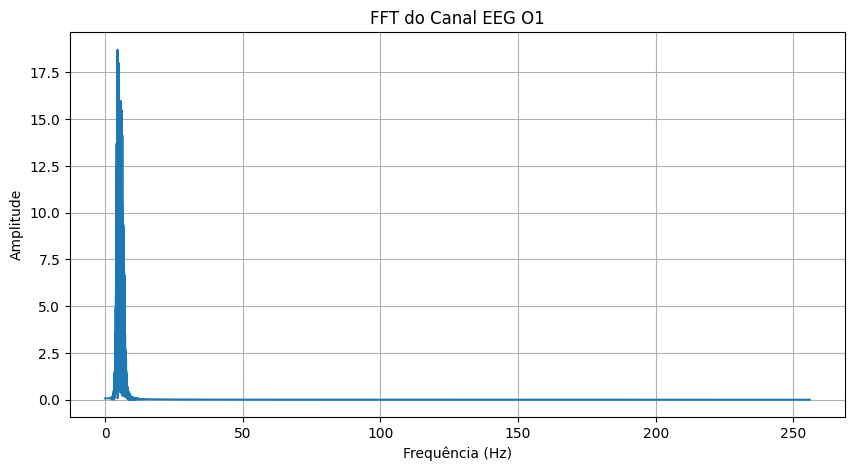

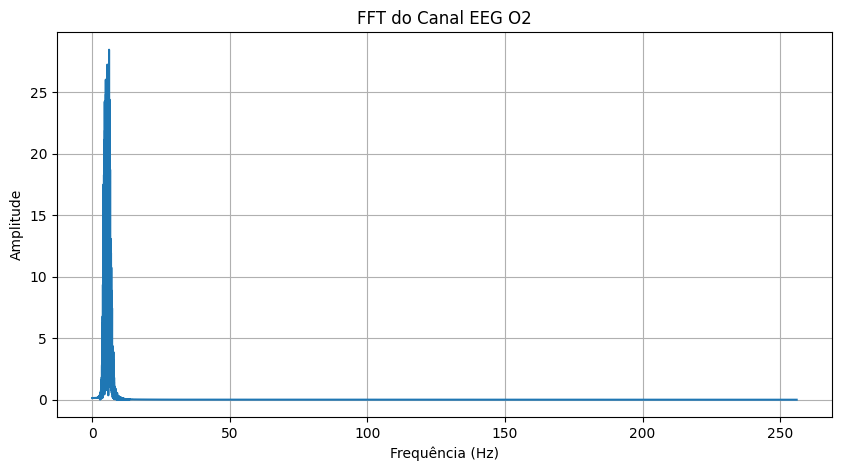

In [ ]:
fs = 512  # Suponha uma frequência de amostragem de 1000 Hz
N = len(result)  # Número de pontos no sinal (supondo que cada linha representa um ponto de dados)
freqs = np.fft.fftfreq(N, 1/fs)  # Frequências correspondentes aos coeficientes do FFT

# Para cada canal de EEG, calcule o FFT e plote o espectro de frequência
for canal in signal_channels:
    fft_values = np.fft.fft(result[canal])
    fft_abs = np.abs(fft_values)  # Obtenha o valor absoluto do FFT para representar o espectro

    plt.figure(figsize=(10, 5))
    plt.plot(freqs[:N//2], fft_abs[:N//2])  # Apenas plote as frequências positivas
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Amplitude')
    plt.title(f'FFT do Canal EEG {canal}')
    plt.grid(True)
    plt.show()

In [ ]:
result.to_csv('/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/Analise_Dados/Registros_Openvibe_recoleta/signal_event_Airton.csv', index=False)

### Normalização:

In [ ]:
# Lendo o arquivo
raw_data = pd.read_csv(caminho_arquivo)

# Removendo colunas indesejadas, renomeando as colunas dos canais, ordenando os sensores pelas posições
raw_data = raw_data.drop(columns=columns_to_remove).rename(columns=map_columns_names)[sorting_columns]

# Renomeando os Eventos
raw_data['Event Id'] = raw_data['Event Id'].replace(map_event_id)

# Plotando um novo dataset dos canais
raw_data

raw_signals = raw_data.iloc[:, 0:16].copy()

In [ ]:
raw_signals_norm = min_max_normalization(raw_signals)
raw_signals_norm

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2
0,0.008215,0.313541,0.050317,0.003031,0.041832,0.006267,0.985715,0.159140,0.397253,0.483962,0.261864,0.986911,0.711760,0.958598,0.931737,0.255700
1,0.010875,0.319268,0.052957,0.004348,0.046714,0.008189,0.986189,0.196102,0.382785,0.428410,0.263379,0.989837,0.709234,0.959890,0.930281,0.252767
2,0.011886,0.329735,0.061783,0.004605,0.053014,0.007168,0.985047,0.222312,0.375102,0.437518,0.260233,0.987041,0.745439,0.963707,0.929602,0.257402
3,0.012820,0.327957,0.059813,0.005630,0.050573,0.008406,0.985715,0.205780,0.394965,0.452565,0.255884,0.988322,0.764244,0.965292,0.930799,0.275092
4,0.012571,0.326904,0.056425,0.005934,0.050744,0.008363,0.986980,0.192339,0.392185,0.453414,0.251534,0.989811,0.736458,0.962239,0.929473,0.272538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,0.988767,0.842012,0.870168,0.995617,0.939323,0.992767,0.031241,0.716667,0.803989,0.751089,0.928893,0.013612,0.377491,0.039582,0.052993,0.917226
328700,0.994539,0.855046,0.879034,0.997389,0.949824,0.995525,0.027955,0.709140,0.824751,0.750184,0.922252,0.014996,0.407522,0.046747,0.052960,0.919781
328701,0.990229,0.852215,0.870956,0.996398,0.949881,0.993278,0.031329,0.752419,0.853932,0.726650,0.925010,0.013559,0.424361,0.037526,0.044872,0.910321
328702,0.992330,0.839774,0.854801,0.996934,0.939096,0.993647,0.037356,0.753360,0.867827,0.731798,0.917942,0.013455,0.431939,0.031125,0.040084,0.928011


### Filtro Car e passa-banda


In [ ]:
eeg_car = CAR_filter(raw_signals_norm, signal_channels)
raw_signals_filtered = eeg_car.apply(bandpass_filter)
raw_signals_filtered

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2
0,-0.002578,-0.002930,-0.000963,-0.002833,-0.002219,-0.002795,-0.002686,0.001431,0.006930,-0.002351,0.001408,-0.002324,0.009625,-0.000819,-0.002430,0.005534
1,-0.002621,-0.002811,-0.000938,-0.002909,-0.002218,-0.002896,-0.002810,0.001796,0.006944,-0.002862,0.001063,-0.002424,0.010266,-0.000767,-0.002583,0.005771
2,-0.002651,-0.002675,-0.000908,-0.002971,-0.002205,-0.002981,-0.002919,0.002150,0.006927,-0.003359,0.000712,-0.002514,0.010853,-0.000714,-0.002725,0.005979
3,-0.002666,-0.002524,-0.000872,-0.003018,-0.002180,-0.003052,-0.003014,0.002493,0.006879,-0.003841,0.000358,-0.002592,0.011384,-0.000659,-0.002856,0.006158
4,-0.002667,-0.002356,-0.000832,-0.003049,-0.002142,-0.003107,-0.003094,0.002824,0.006800,-0.004304,0.000002,-0.002659,0.011856,-0.000604,-0.002974,0.006307
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-0.000022,-0.000089,-0.000048,-0.000008,-0.000066,-0.000019,-0.000019,0.000010,-0.000192,0.000032,0.000002,0.000021,0.000236,0.000040,0.000005,0.000118
328700,-0.000019,-0.000079,-0.000043,-0.000007,-0.000059,-0.000017,-0.000017,0.000008,-0.000171,0.000029,0.000003,0.000019,0.000209,0.000035,0.000005,0.000105
328701,-0.000017,-0.000070,-0.000038,-0.000006,-0.000052,-0.000014,-0.000015,0.000006,-0.000151,0.000025,0.000003,0.000017,0.000184,0.000031,0.000004,0.000093
328702,-0.000015,-0.000062,-0.000034,-0.000005,-0.000046,-0.000012,-0.000013,0.000005,-0.000133,0.000022,0.000003,0.000015,0.000160,0.000027,0.000004,0.000082


### Gerando o tempo:

In [ ]:
time = calculate_time(raw_signals_norm, 512)

### Plots:

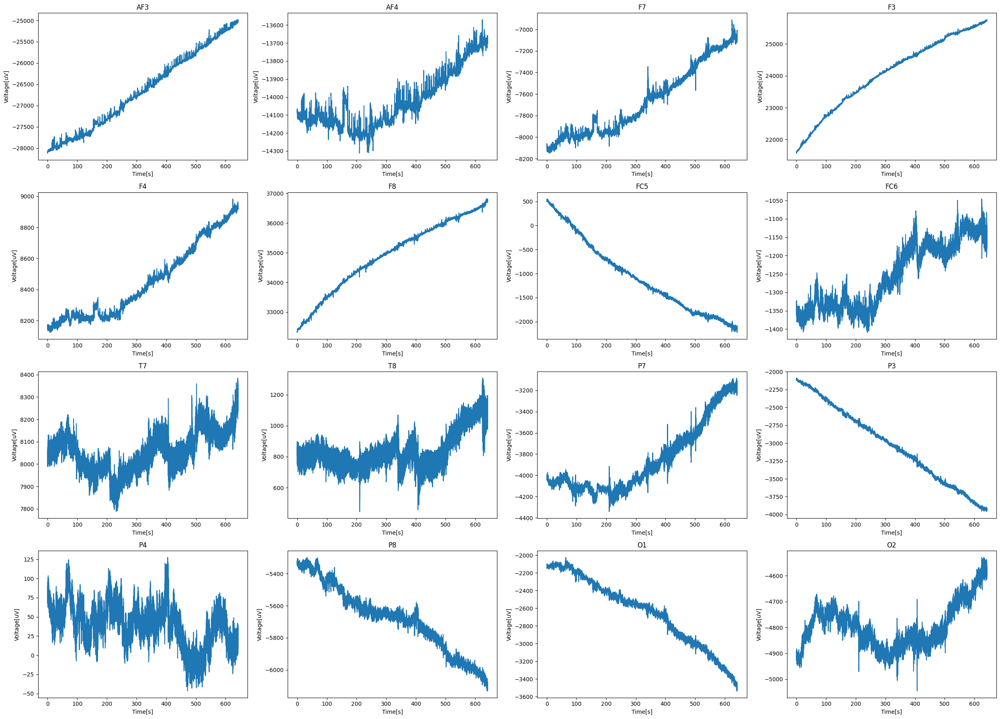

In [ ]:
plot_eeg_data(raw_signals, time)

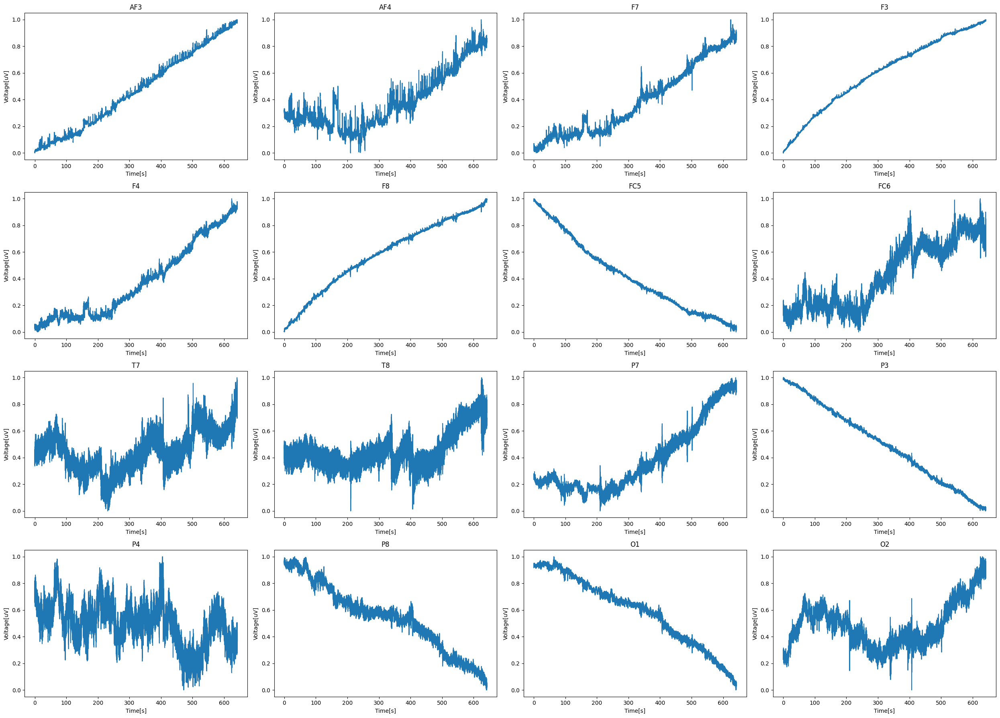

In [ ]:
plot_eeg_data(raw_signals_norm, time)

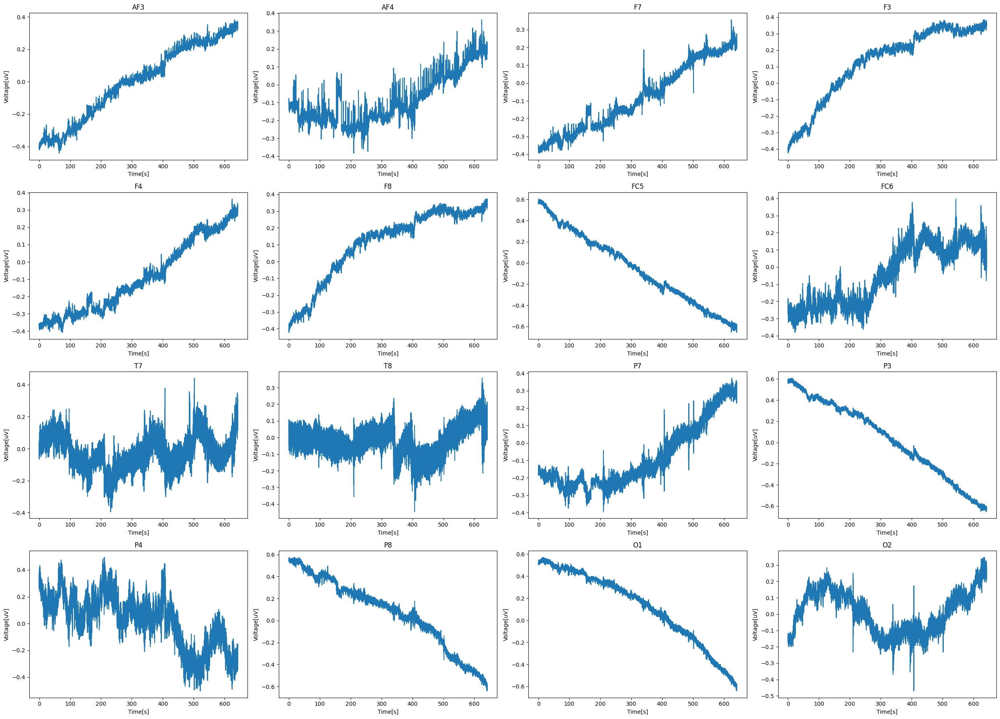

In [ ]:
plot_eeg_data(eeg_car, time)

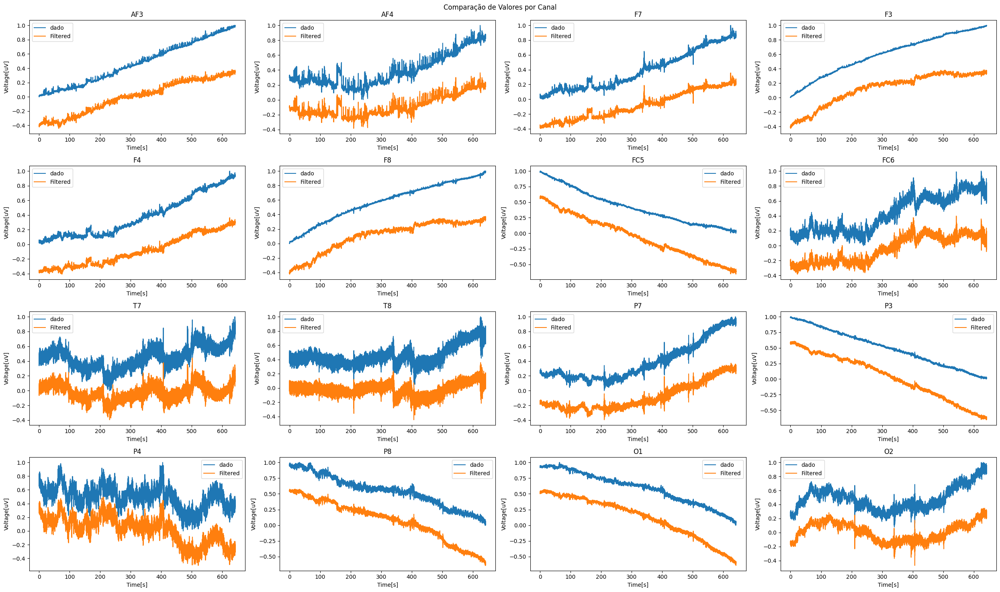

In [ ]:
# Chamada da função para comparar os DataFrames
comparar_sinais(raw_signals_norm, eeg_car, signal_channels, time)

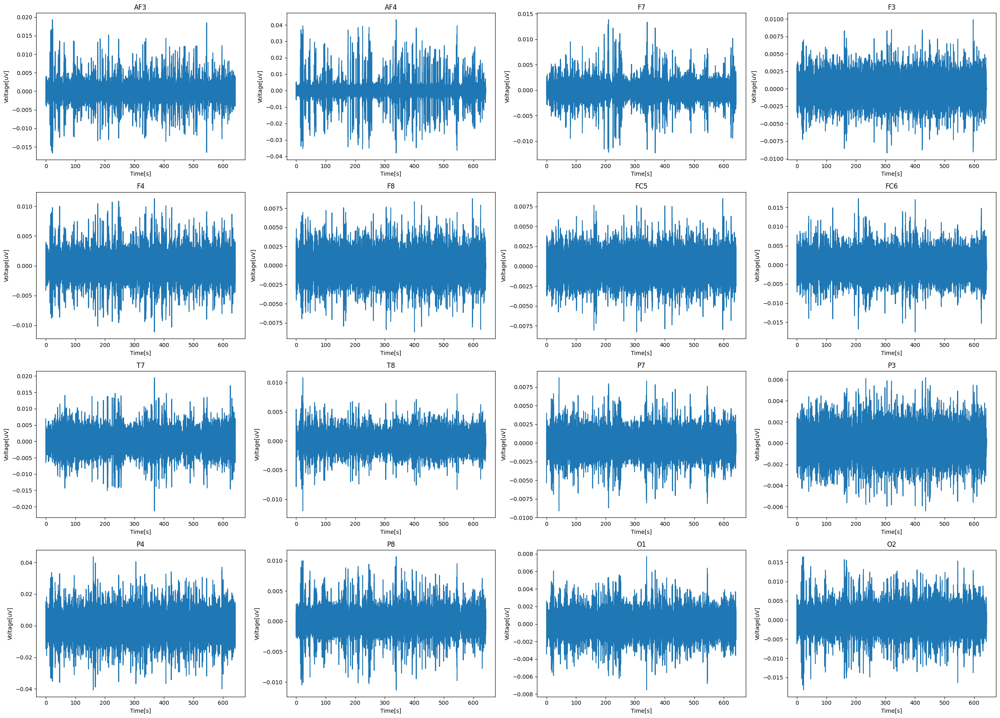

In [ ]:
plot_eeg_data(raw_signals_filtered, time)

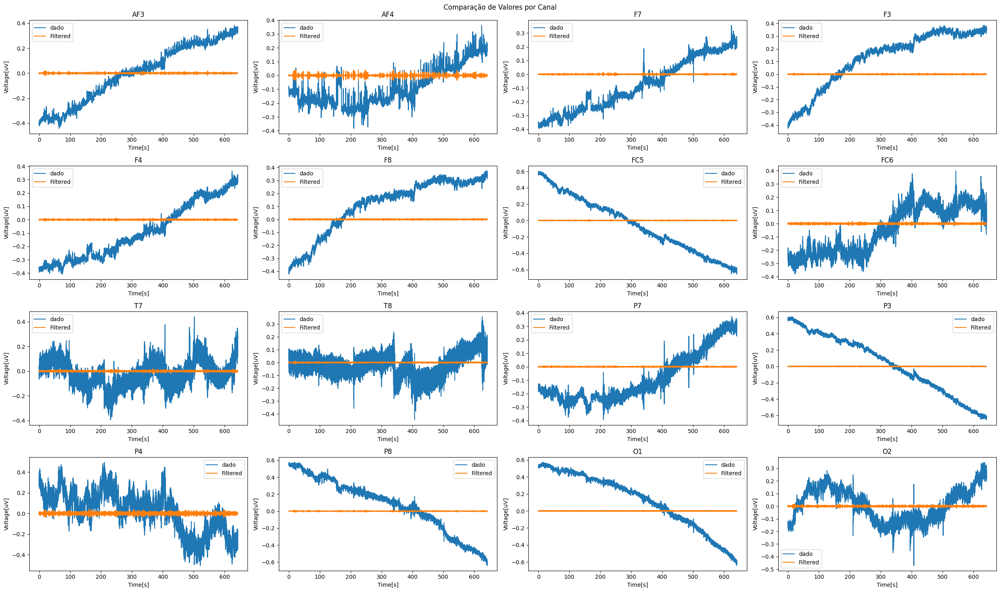

In [ ]:
# Chamada da função para comparar os DataFrames
comparar_sinais(eeg_car, raw_signals_filtered, signal_channels, time)

In [ ]:
# Frequência dos sinais em Hz
frequencia = 512

df_baseline_open

# Função para calcular o tempo em segundos com base no índice
def calcular_tempo(indice, frequencia):
    return indice / frequencia

# Calcular tempo inicial e final para df_baseline_close
indice_inicial_df_baseline_close = df_baseline_close.index.min()
indice_final_df_baseline_close = df_baseline_close.index.max()
tempo_inicial_df_baseline_close = calcular_tempo(indice_inicial_df_baseline_close, frequencia)
tempo_final_df_baseline_close = calcular_tempo(indice_final_df_baseline_close, frequencia)

# Calcular tempo inicial e final para df_baseline_open
indice_inicial_df_baseline_open = df_baseline_open.index.min()
indice_final_df_baseline_open = df_baseline_open.index.max()
tempo_inicial_df_baseline_open = calcular_tempo(indice_inicial_df_baseline_open, frequencia)
tempo_final_df_baseline_open = calcular_tempo(indice_final_df_baseline_open, frequencia)

# Imprimir os resultados
print("Tempo inicial e final para procol1:", tempo_inicial_df_baseline_close, "s -", tempo_final_df_baseline_close, "s")
print("Duração do procol1:", tempo_final_df_baseline_close - tempo_inicial_df_baseline_close, "s")

print("Tempo inicial e final para procol2:", tempo_inicial_df_baseline_open, "s -", tempo_final_df_baseline_open, "s")
print("Duração do procol2:", tempo_final_df_baseline_open - tempo_inicial_df_baseline_open, "s")

Tempo inicial e final para procol1: 149.0 s - 168.998046875 s
Duração do procol1: 19.998046875 s
Tempo inicial e final para procol2: 169.0 s - 188.998046875 s
Duração do procol2: 19.998046875 s


In [ ]:
# Frequência dos sinais em Hz
frequencia = 512

procol1 = eventos_stim[eventos_stim['n_back'] == 1]
procol2 = eventos_stim[eventos_stim['n_back'] == 2]
procol3 = eventos_stim[eventos_stim['n_back'] == 3]

# Função para calcular o tempo em segundos com base no índice
def calcular_tempo(indice, frequencia):
    return indice / frequencia

# Calcular tempo inicial e final para procol1
indice_inicial_procol1 = procol1.index.min()
indice_final_procol1 = procol1.index.max()
tempo_inicial_procol1 = calcular_tempo(indice_inicial_procol1, frequencia)
tempo_final_procol1 = calcular_tempo(indice_final_procol1, frequencia)

# Calcular tempo inicial e final para procol2
indice_inicial_procol2 = procol2.index.min()
indice_final_procol2 = procol2.index.max()
tempo_inicial_procol2 = calcular_tempo(indice_inicial_procol2, frequencia)
tempo_final_procol2 = calcular_tempo(indice_final_procol2, frequencia)

# Calcular tempo inicial e final para procol3
indice_inicial_procol3 = procol3.index.min()
indice_final_procol3 = procol3.index.max()
tempo_inicial_procol3 = calcular_tempo(indice_inicial_procol3, frequencia)
tempo_final_procol3 = calcular_tempo(indice_final_procol3, frequencia)

# Imprimir os resultados
print("Tempo inicial e final para procol1:", tempo_inicial_procol1, "s -", tempo_final_procol1, "s")
print("Duração do procol1:", tempo_final_procol1 - tempo_inicial_procol1, "s")

print("Tempo inicial e final para procol2:", tempo_inicial_procol2, "s -", tempo_final_procol2, "s")
print("Duração do procol2:", tempo_final_procol2 - tempo_inicial_procol2, "s")

print("Tempo inicial e final para procol3:", tempo_inicial_procol3, "s -", tempo_final_procol3, "s")
print("Duração do procol3:", tempo_final_procol3 - tempo_inicial_procol3, "s")


Tempo inicial e final para procol1: 258.0 s - 325.998046875 s
Duração do procol1: 67.998046875 s
Tempo inicial e final para procol2: 411.0 s - 483.998046875 s
Duração do procol2: 72.998046875 s
Tempo inicial e final para procol3: 548.0 s - 621.998046875 s
Duração do procol3: 73.998046875 s


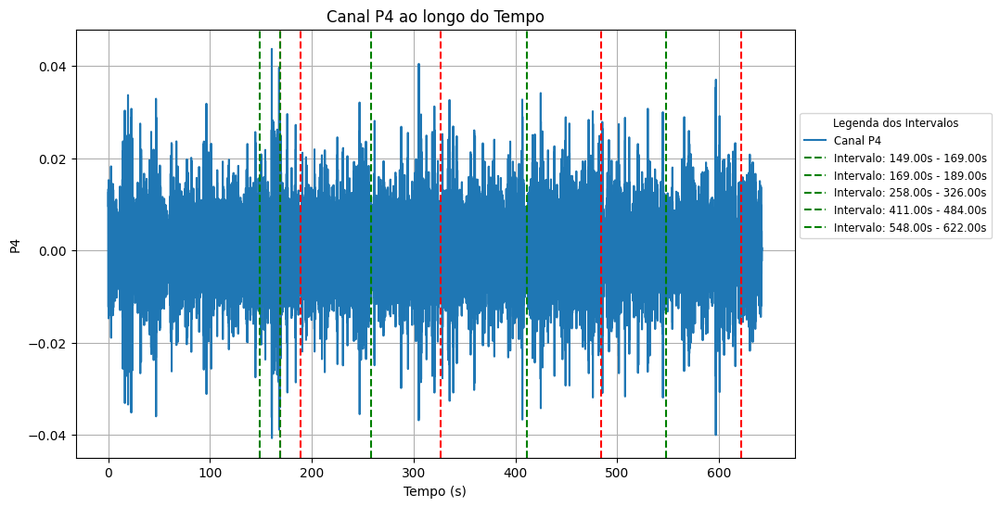

In [ ]:
# Defina os tempos iniciais e finais dos intervalos
tempos_iniciais = [tempo_inicial_df_baseline_close,tempo_inicial_df_baseline_open, tempo_inicial_procol1, tempo_inicial_procol2, tempo_inicial_procol3]
tempos_finais = [tempo_final_df_baseline_close, tempo_final_df_baseline_open, tempo_final_procol1, tempo_final_procol2, tempo_final_procol3]

plt.figure(figsize=(10, 6))  # Defina o tamanho da figura
plt.plot(time, raw_signals_filtered['P4'], label='Canal P4')  # Plote P4 ao longo do eixo do tempo

# Adicione linhas verticais para marcar os intervalos de tempo
for inicio, fim in zip(tempos_iniciais, tempos_finais):
    plt.axvline(x=inicio, color='green', linestyle='--', label=f'Intervalo: {inicio:.2f}s - {fim:.2f}s')
    plt.axvline(x=fim, color='red', linestyle='--')

plt.xlabel('Tempo (s)')  # Defina o rótulo do eixo x
plt.ylabel('P4')  # Defina o rótulo do eixo y
plt.title('Canal P4 ao longo do Tempo')  # Defina o título do gráfico
plt.legend(loc='lower left', bbox_to_anchor=(1, 0.5),fontsize='small', title='Legenda dos Intervalos', title_fontsize='small')  # Adicione a legenda
plt.grid(True)  # Adicione grade ao gráfico
plt.show()  # Mostra o gráfico

<Figure size 1200x800 with 0 Axes>

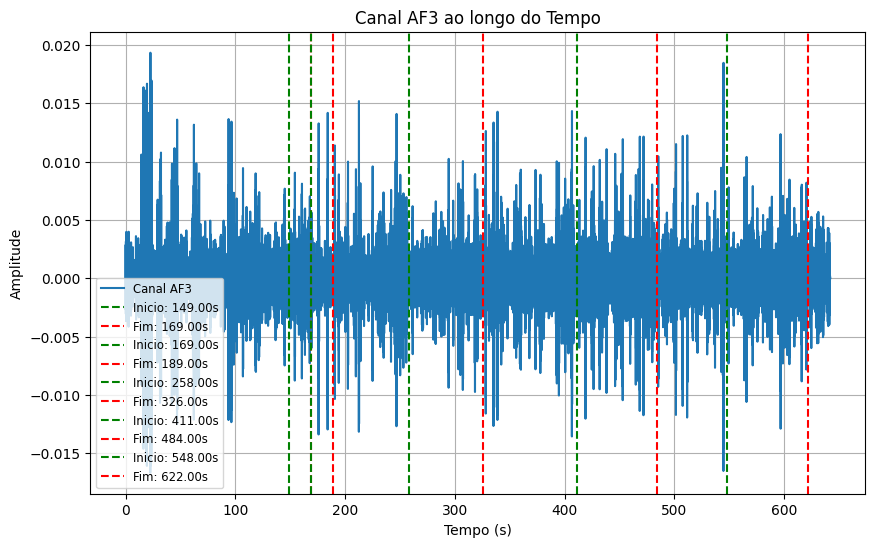

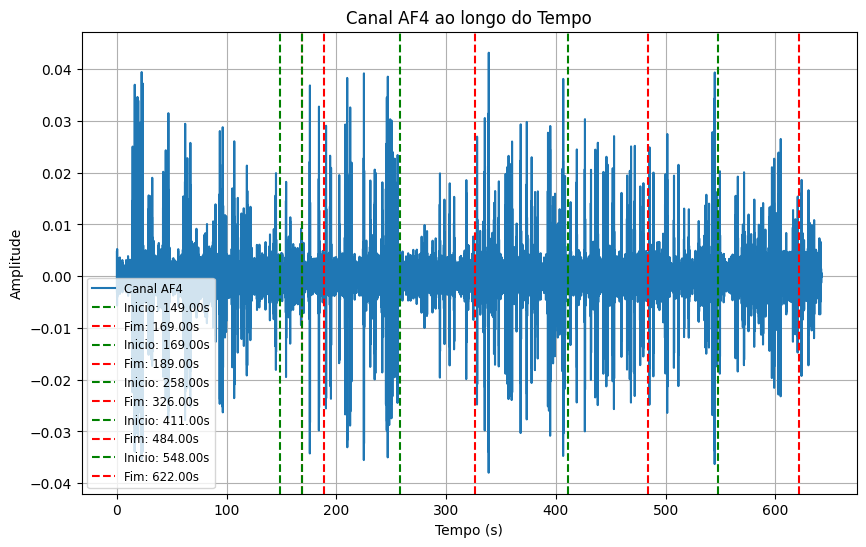

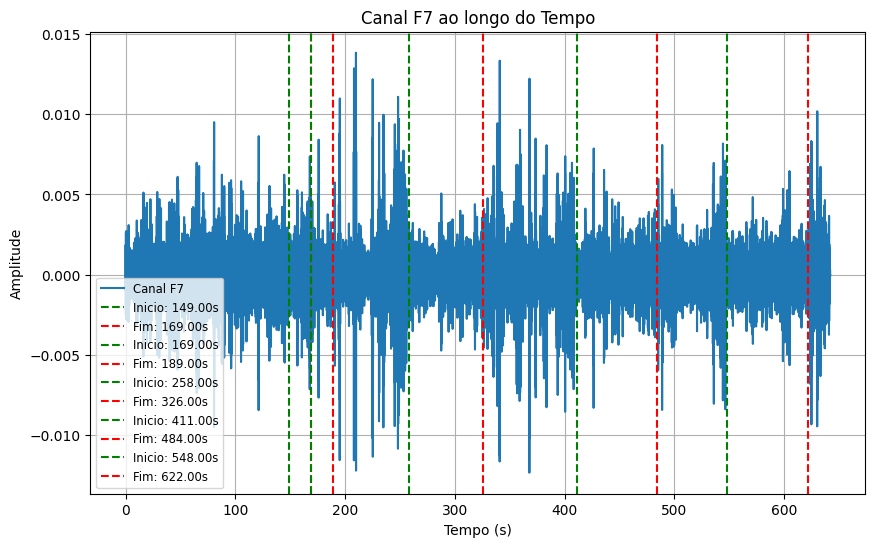

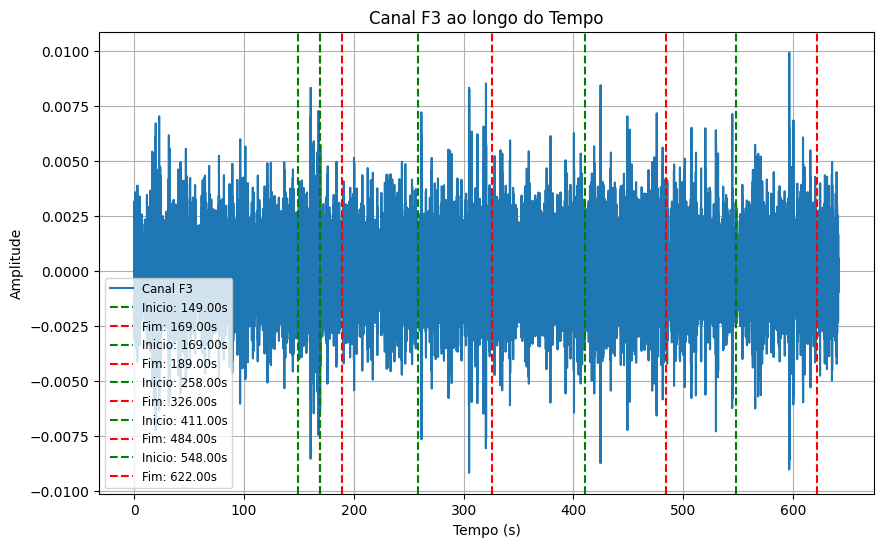

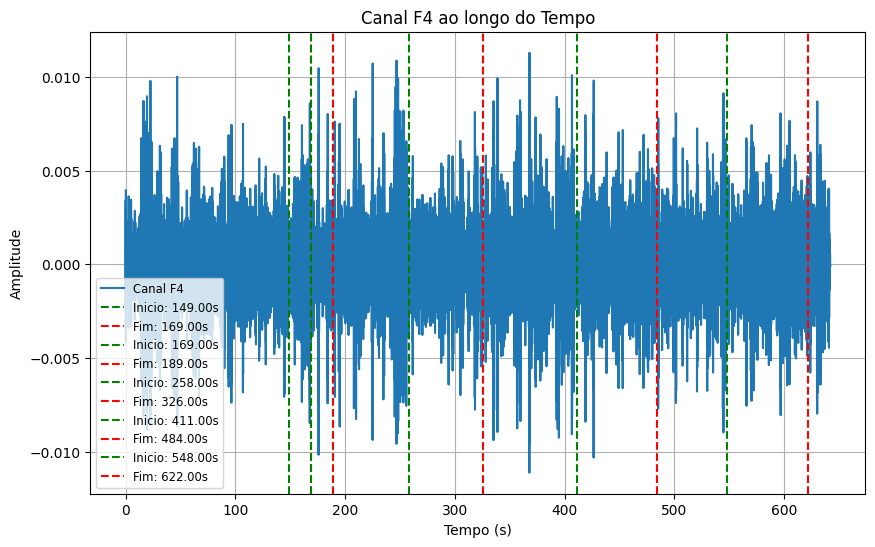

...

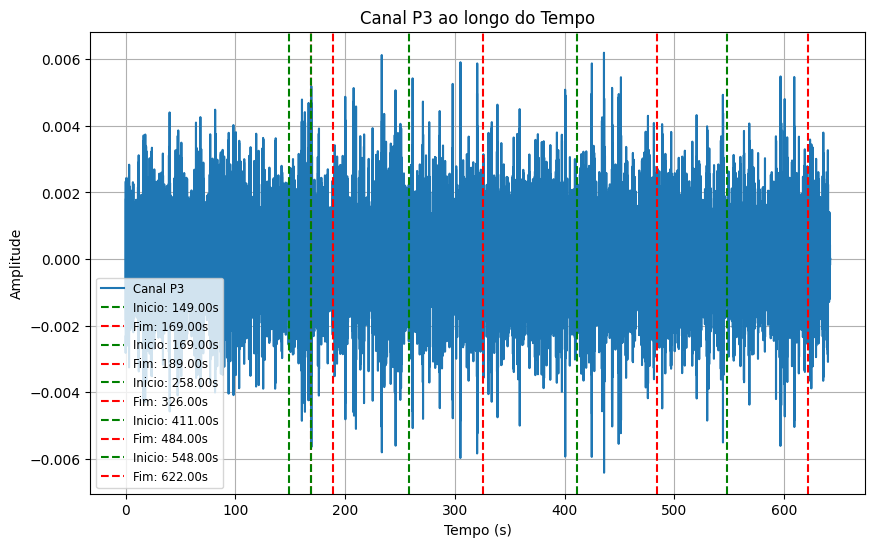

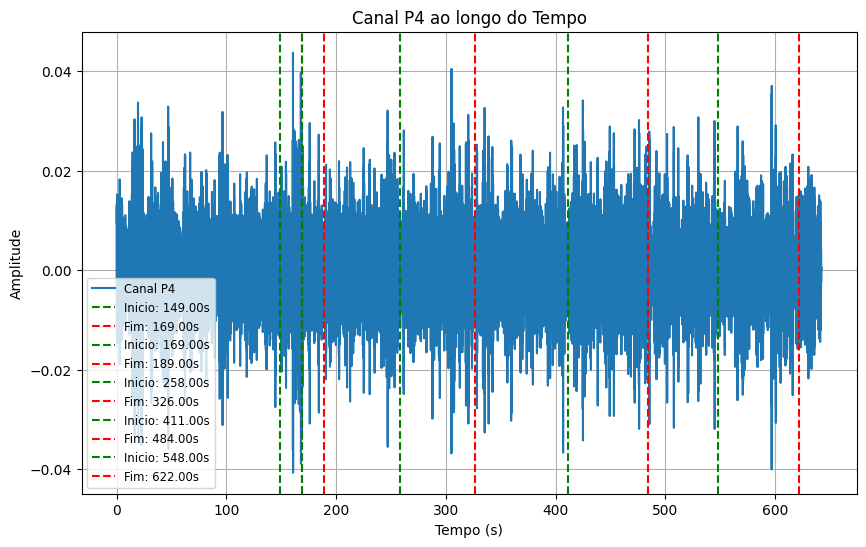

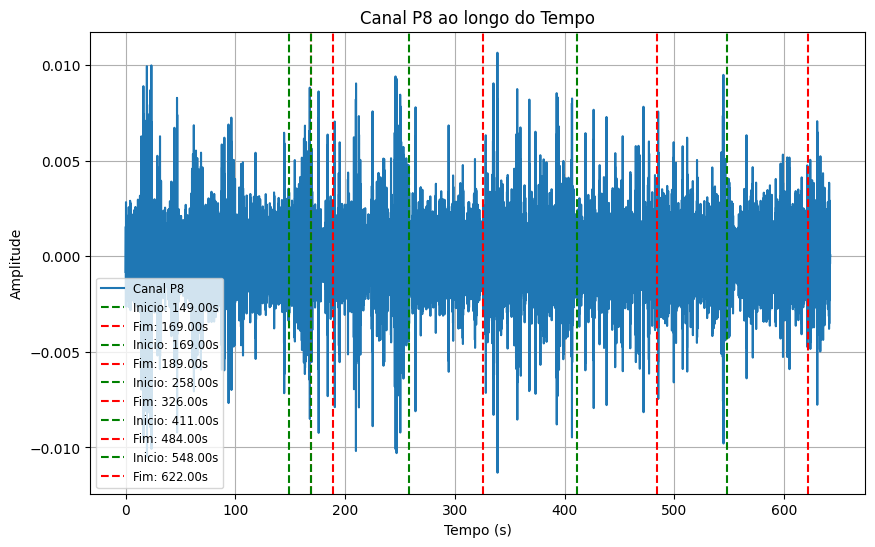

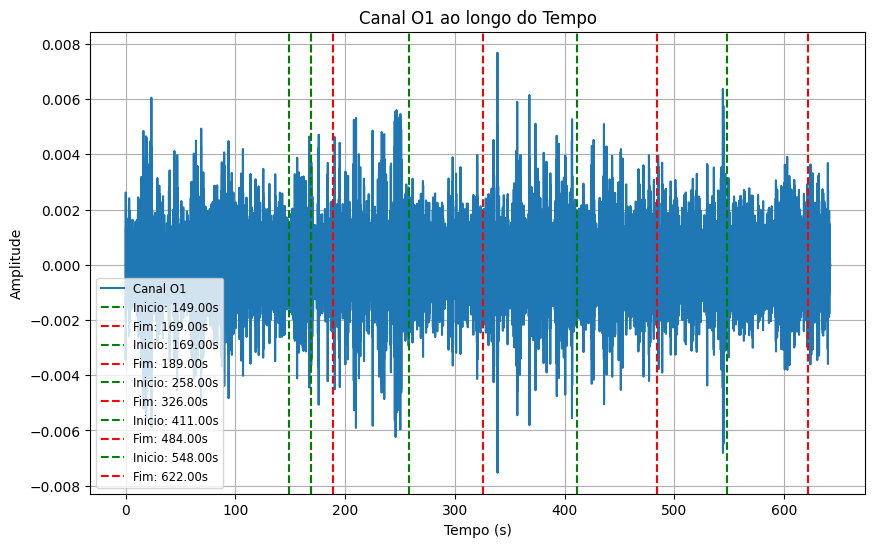

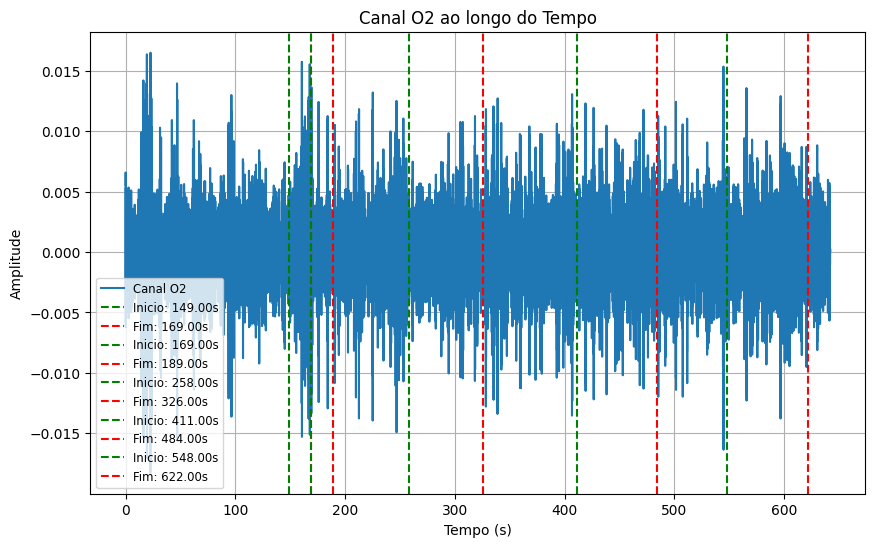

In [ ]:
import matplotlib.pyplot as plt

# Supondo que raw_signals_filtered seja o DataFrame contendo os canais de EEG
# e a frequência de aquisição é de 512 Hz

# Defina os tempos iniciais e finais dos intervalos
tempos_iniciais = [tempo_inicial_df_baseline_close, tempo_inicial_df_baseline_open, tempo_inicial_procol1, tempo_inicial_procol2, tempo_inicial_procol3]
tempos_finais = [tempo_final_df_baseline_close, tempo_final_df_baseline_open, tempo_final_procol1, tempo_final_procol2, tempo_final_procol3]

# Tamanho da figura
plt.figure(figsize=(12, 8))

# Loop para analisar cada canal e plotar em uma figura separada
# Loop para analisar cada canal e plotar em uma figura separada
for nome_canal in raw_signals_filtered.columns[:16]:
    canal_eeg = raw_signals_filtered[nome_canal]

    # Crie uma nova figura para cada canal
    plt.figure(figsize=(10, 6))

    # Plote o canal ao longo do tempo
    plt.plot(time, canal_eeg, label=f'Canal {nome_canal}', linestyle='-')

    # Adicione marcadores nos tempos iniciais e finais das janelas
    for inicio, fim in zip(tempos_iniciais, tempos_finais):
        plt.axvline(x=inicio, color='green', linestyle='--', label=f'Inicio: {inicio:.2f}s')
        plt.axvline(x=fim, color='red', linestyle='--', label=f'Fim: {fim:.2f}s')

    plt.xlabel('Tempo (s)')  # Defina o rótulo do eixo x
    plt.ylabel('Amplitude')  # Defina o rótulo do eixo y
    plt.title(f'Canal {nome_canal} ao longo do Tempo')  # Defina o título do gráfico
    plt.legend(loc='lower left', fontsize='small')  # Adicione a legenda
    plt.grid(True)  # Adicione grade ao gráfico
    plt.show()  # Mostra o gráfico


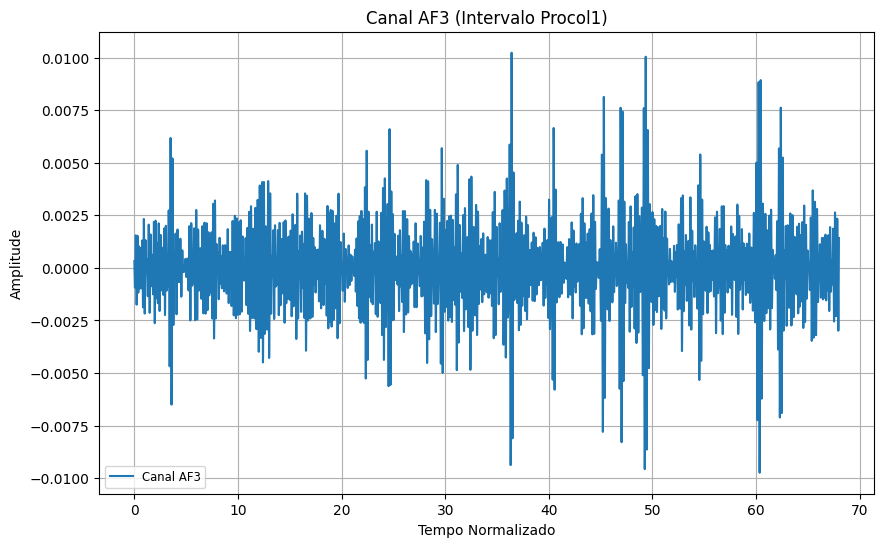

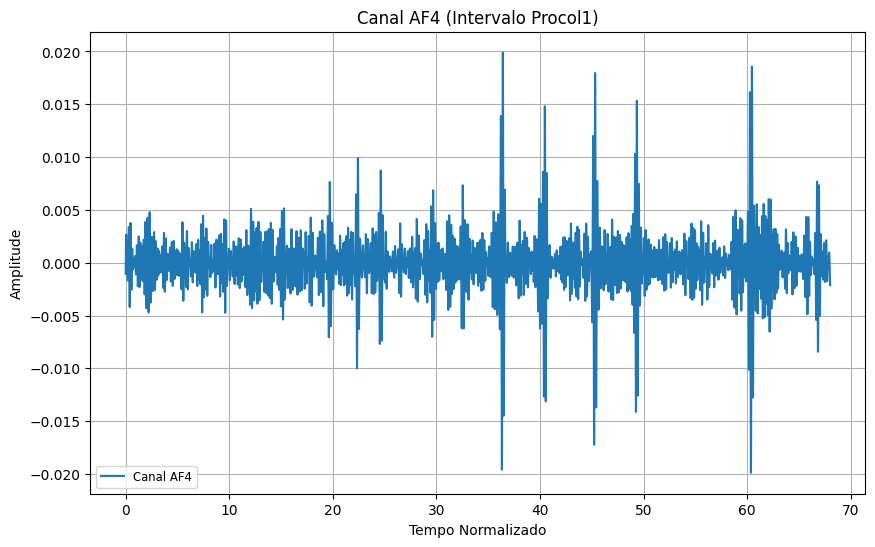

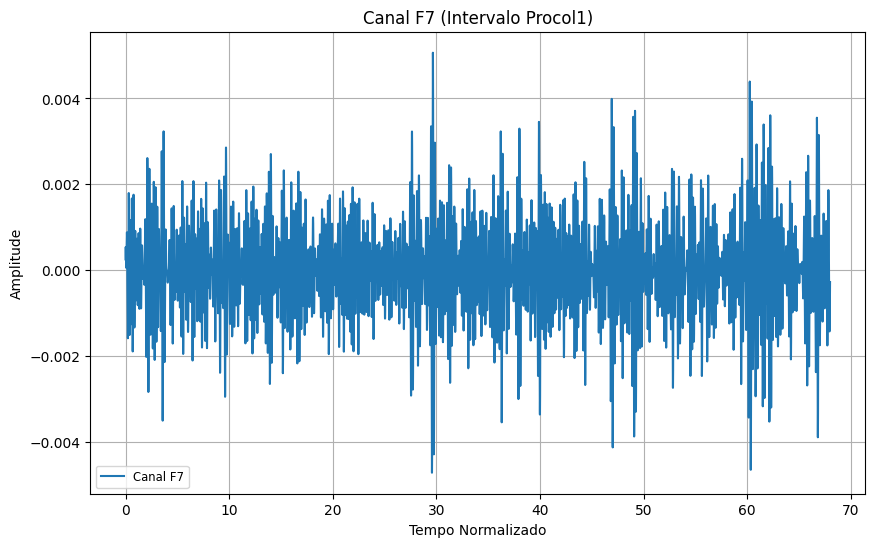

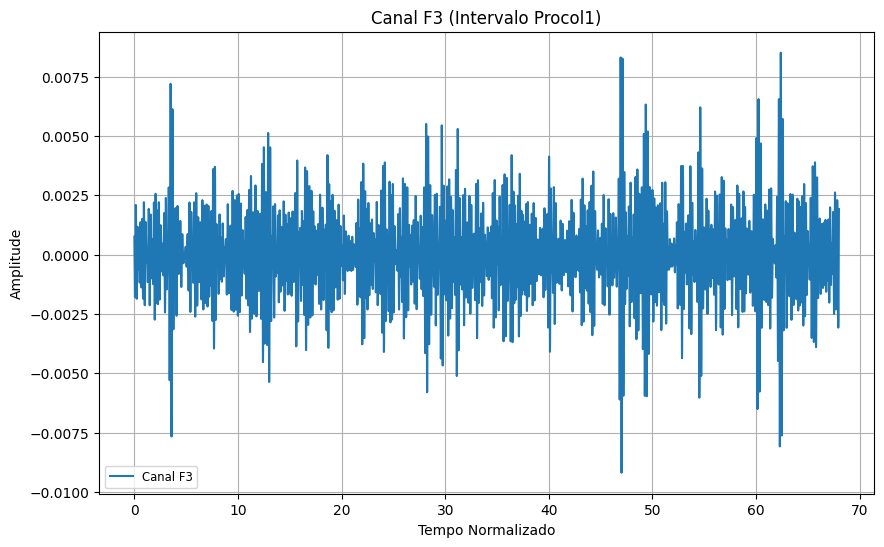

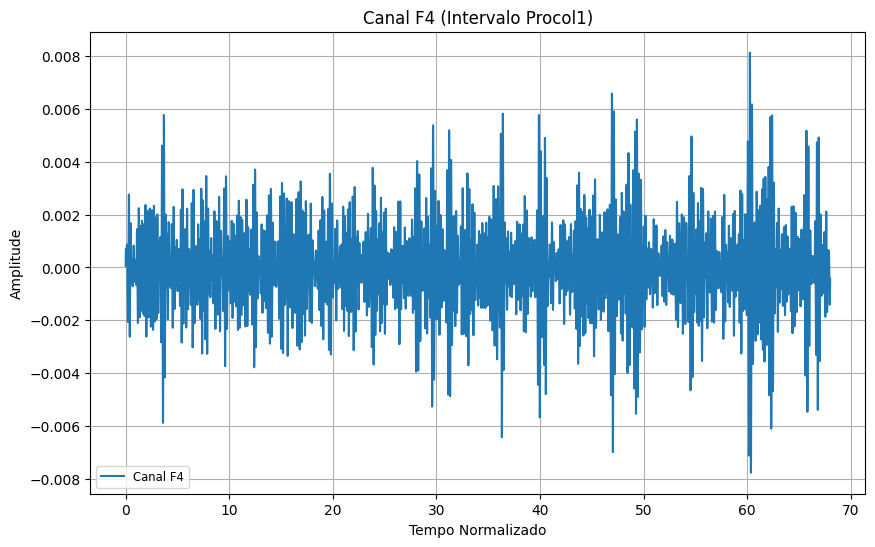

...

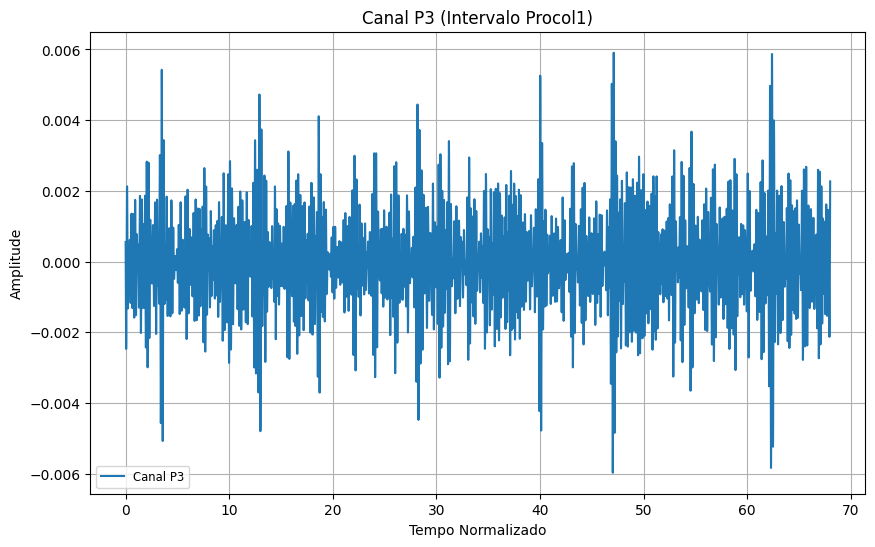

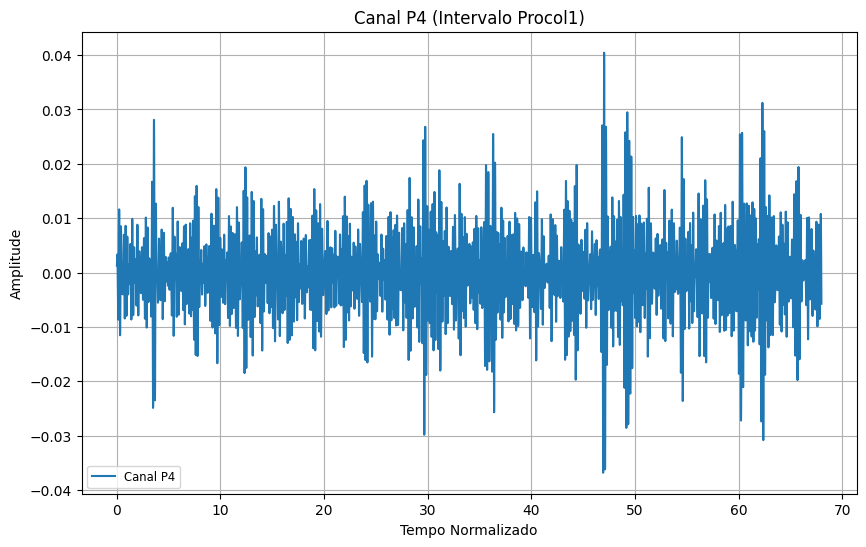

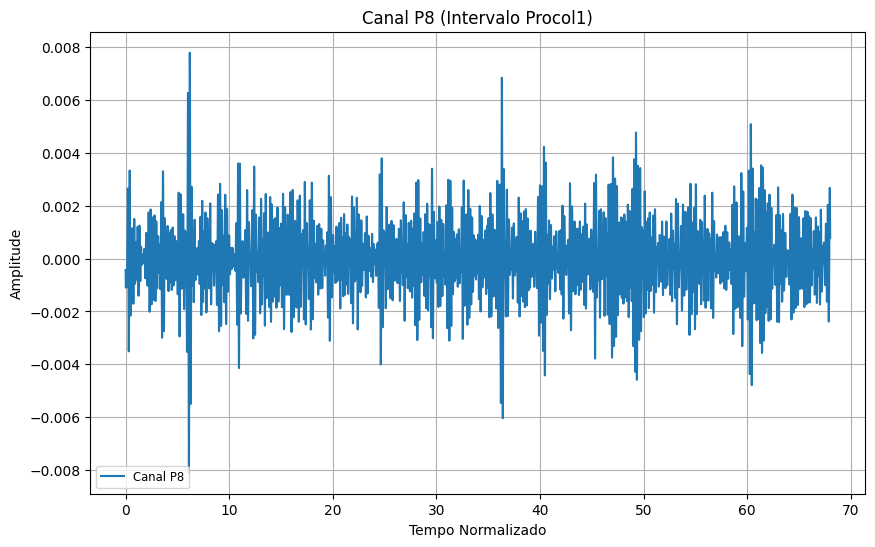

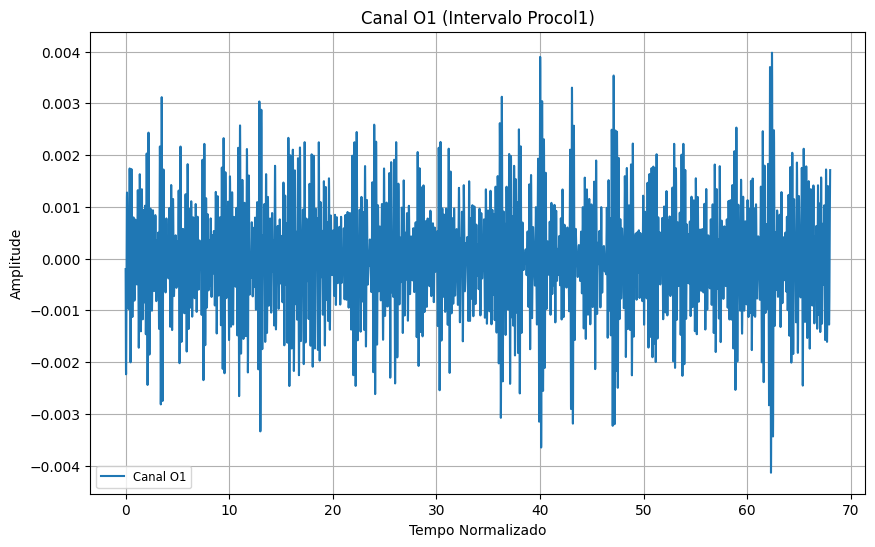

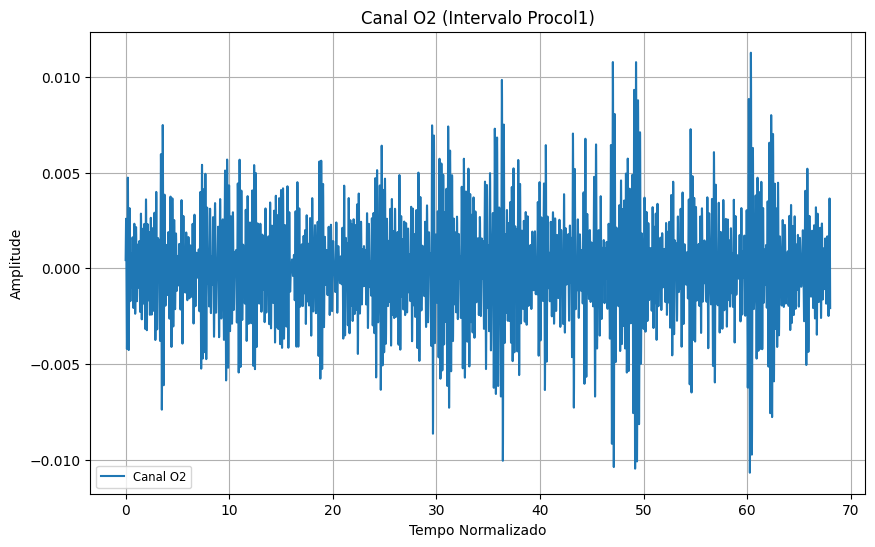

In [ ]:
# Normalização do eixo x
min_x = 0
max_x = 67.998046875
step = 2  # Intervalos de 2 unidades no eixo x


# Loop para analisar cada canal e plotar em uma figura separada
for nome_canal in raw_signals_filtered.columns[:16]:
    canal_eeg = raw_signals_filtered.loc[indice_inicial_procol1:indice_final_procol1, nome_canal]
    indice_x = np.linspace(min_x, max_x, len(canal_eeg))  # Normalização do eixo x

    # Crie uma nova figura para cada canal
    plt.figure(figsize=(10, 6))

    # Plote o canal ao longo do tempo
    plt.plot(indice_x, canal_eeg, label=f'Canal {nome_canal}', linestyle='-')

    plt.xlabel('Tempo Normalizado')  # Defina o rótulo do eixo x
    plt.ylabel('Amplitude')  # Defina o rótulo do eixo y
    plt.title(f'Canal {nome_canal} (Intervalo Procol1)')  # Defina o título do gráfico
    plt.legend(loc='lower left', fontsize='small')  # Adicione a legenda
    plt.grid(True)  # Adicione grade ao gráfico
    plt.show()  # Mostra o gráfico

In [ ]:
frequencia_aquisicao = 512  # Hz
janela_segundos = 30  # Tamanho da janela em segundos

# Loop para analisar cada canal
for nome_canal in raw_signals_filtered.columns[:16]:
    canal_eeg = raw_signals_filtered[nome_canal]

    # Calcule a derivada do sinal para identificar picos
    derivada_sinal = np.gradient(canal_eeg)

    # Encontre os picos na derivada do sinal
    picos, _ = find_peaks(derivada_sinal, distance=100)  # Ajuste a distância conforme necessário

    # Determine o intervalo de tempo em segundos com mais picos
    intervalo_com_mais_picos = canal_eeg.index[picos]
    inicio_intervalo_mais_picos = intervalo_com_mais_picos.min() / frequencia_aquisicao
    fim_intervalo_mais_picos = intervalo_com_mais_picos.max() / frequencia_aquisicao

    # Encontre as janelas de 10 segundos com a maior e a menor quantidade de picos
    janelas_picos = []
    for i in range(0, len(canal_eeg), janela_segundos * frequencia_aquisicao):
        janela = canal_eeg[i:i + janela_segundos * frequencia_aquisicao]
        picos_janela, _ = find_peaks(np.gradient(janela), distance=100)
        janelas_picos.append((i / frequencia_aquisicao, len(picos_janela)))

    # Encontre a janela com mais picos
    maior_picos = max(janelas_picos, key=lambda x: x[1])
    menor_picos = min(janelas_picos, key=lambda x: x[1])

    # Imprima os resultados
    print(f"Canal {nome_canal}:")
    print(f"Janela de {janela_segundos}s com mais picos - {maior_picos[0]:.2f}s a {maior_picos[0] + janela_segundos:.2f}s")
    print(f"Janela de {janela_segundos}s com menos picos - {menor_picos[0]:.2f}s a {menor_picos[0] + janela_segundos:.2f}s")

Canal AF3:
Janela de 30s com mais picos - 90.00s a 120.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal AF4:
Janela de 30s com mais picos - 210.00s a 240.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal F7:
Janela de 30s com mais picos - 300.00s a 330.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal F3:
Janela de 30s com mais picos - 60.00s a 90.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal F4:
Janela de 30s com mais picos - 510.00s a 540.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal F8:
Janela de 30s com mais picos - 180.00s a 210.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal FC5:
Janela de 30s com mais picos - 60.00s a 90.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal FC6:
Janela de 30s com mais picos - 240.00s a 270.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal T7:
Janela de 30s com mais picos - 30.00s a 60.00s
Janela de 30s com menos picos - 630.00s a 660.00s
Canal T8:
Janela de 30

In [ ]:
# Loop para analisar cada canal
for nome_canal in raw_signals_filtered.columns[:16]:
    canal_eeg = raw_signals_filtered[nome_canal]

    # Encontre os picos no canal
    picos, _ = find_peaks(canal_eeg)

    # Encontre o índice do maior pico
    indice_maior_pico = picos[np.argmax(canal_eeg[picos])]

    # Calcule o tempo correspondente ao maior pico em segundos
    tempo_maior_pico = indice_maior_pico / frequencia_aquisicao

    # Verifique se o tempo do maior pico está dentro dos intervalos
    dentro_intervalo = False
    for inicio, fim in zip(tempos_iniciais, tempos_finais):
        if inicio <= tempo_maior_pico <= fim:
            dentro_intervalo = True
            break

    # Imprima o resultado
    if dentro_intervalo:
        print(f"Canal {nome_canal}: Maior pico em {tempo_maior_pico:.2f} segundos (Dentro do intervalo)")
    else:
        print(f"Canal {nome_canal}: Maior pico em {tempo_maior_pico:.2f} segundos (Fora do intervalo)")

Canal AF3: Maior pico em 22.58 segundos (Fora do intervalo)
Canal AF4: Maior pico em 338.88 segundos (Fora do intervalo)
Canal F7: Maior pico em 209.87 segundos (Fora do intervalo)
Canal F3: Maior pico em 596.77 segundos (Dentro do intervalo)
Canal F4: Maior pico em 367.99 segundos (Fora do intervalo)
Canal F8: Maior pico em 596.77 segundos (Dentro do intervalo)
Canal FC5: Maior pico em 596.77 segundos (Dentro do intervalo)
Canal FC6: Maior pico em 208.11 segundos (Fora do intervalo)
Canal T7: Maior pico em 368.10 segundos (Fora do intervalo)
Canal T8: Maior pico em 22.67 segundos (Fora do intervalo)
Canal P7: Maior pico em 42.33 segundos (Fora do intervalo)
Canal P3: Maior pico em 435.88 segundos (Dentro do intervalo)
Canal P4: Maior pico em 160.59 segundos (Dentro do intervalo)
Canal P8: Maior pico em 338.79 segundos (Fora do intervalo)
Canal O1: Maior pico em 338.79 segundos (Fora do intervalo)
Canal O2: Maior pico em 22.67 segundos (Fora do intervalo)


### Epochs:

In [ ]:
protoc_1 = marcador_start_eventos[0:37]
protoc_2 = marcador_start_eventos[37:75]
protoc_3 = marcador_start_eventos[75:114]

print(len(protoc_1))
print(len(protoc_2))
print(len(protoc_3))
print(len(marcador_start_eventos))

37
38
39
114


In [ ]:
init_exp = np.array([0])
splits_events = np.concatenate((init_exp, marcador_start_eventos))
splits_events

array([     0, 132096, 133120, 134144, 135168, 136192, 137216, 137728,
       138752, 139776, 140800, 141824, 142336, 143360, 144384, 145408,
       146432, 147456, 147968, 148992, 150016, 151040, 152064, 152576,
       153600, 154624, 155136, 156160, 157184, 158208, 159232, 160256,
       161280, 161792, 162816, 163840, 164864, 165888, 210432, 211456,
       212480, 213504, 214528, 215552, 216064, 217088, 218112, 219136,
       220160, 221184, 222208, 223232, 224256, 224768, 225792, 226816,
       227840, 228864, 229888, 230912, 231936, 232960, 233984, 235008,
       236032, 237056, 238080, 239104, 240128, 241152, 241664, 242688,
       243712, 244736, 245760, 246784, 280576, 281600, 282624, 283648,
       284160, 284672, 285696, 286720, 287744, 288768, 289792, 290816,
       291328, 292352, 293376, 294400, 295424, 296448, 297472, 298496,
       299520, 300544, 301568, 302592, 303616, 304640, 305664, 306688,
       307712, 308736, 309760, 310784, 311808, 312832, 313344, 314368,
      

In [ ]:
protocol_type = []
for value in splits_events:
  if value in protoc_1:
    protocol_type.append(1)
  elif value in protoc_2:
    protocol_type.append(2)
  elif value in protoc_3:
    protocol_type.append(3)
  else:
    protocol_type.append(0)

len(protocol_type)

115

In [ ]:
event_mne = np.zeros((splits_events.shape[0],3), dtype = 'int')

event_mne[:,0] = splits_events
event_mne[:,2] = protocol_type

event_mne[splits_events.shape[0]-1,2] = 3

In [ ]:
event_mne

array([[     0,      0,      0],
       [132096,      0,      1],
       [133120,      0,      1],
       [134144,      0,      1],
       [135168,      0,      1],
       [136192,      0,      1],
       [137216,      0,      1],
       [137728,      0,      1],
       [138752,      0,      1],
       [139776,      0,      1],
       [140800,      0,      1],
       [141824,      0,      1],
       [142336,      0,      1],
       [143360,      0,      1],
       [144384,      0,      1],
       [145408,      0,      1],
       [146432,      0,      1],
       [147456,      0,      1],
       [147968,      0,      1],
       [148992,      0,      1],
       [150016,      0,      1],
       [151040,      0,      1],
       [152064,      0,      1],
       [152576,      0,      1],
       [153600,      0,      1],
       [154624,      0,      1],
       [155136,      0,      1],
       [156160,      0,      1],
       [157184,      0,      1],
       [158208,      0,      1],
       [15

## Formação de um dataset - Machine Learning:

In [ ]:
# Converter event_mne para DataFrame
event_df = pd.DataFrame(event_mne, columns=['Index', 'Zeros', 'Type'])

# Definir a coluna 'Index' como índice
event_df.set_index('Index', inplace=True)

# Concatenar os dataframes
signal_ml = pd.concat([raw_signals_filtered, event_df['Type']], axis=1)

# Renomear a nova coluna
signal_ml = signal_ml.rename(columns={'Type': 'Event_ID'})

# Verificar o novo dataframe
signal_ml

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,Event_ID
0,-0.002578,-0.002930,-0.000963,-0.002833,-0.002219,-0.002795,-0.002686,0.001431,0.006930,-0.002351,0.001408,-0.002324,0.009625,-0.000819,-0.002430,0.005534,0.0
1,-0.002621,-0.002811,-0.000938,-0.002909,-0.002218,-0.002896,-0.002810,0.001796,0.006944,-0.002862,0.001063,-0.002424,0.010266,-0.000767,-0.002583,0.005771,NaN
2,-0.002651,-0.002675,-0.000908,-0.002971,-0.002205,-0.002981,-0.002919,0.002150,0.006927,-0.003359,0.000712,-0.002514,0.010853,-0.000714,-0.002725,0.005979,NaN
3,-0.002666,-0.002524,-0.000872,-0.003018,-0.002180,-0.003052,-0.003014,0.002493,0.006879,-0.003841,0.000358,-0.002592,0.011384,-0.000659,-0.002856,0.006158,NaN
4,-0.002667,-0.002356,-0.000832,-0.003049,-0.002142,-0.003107,-0.003094,0.002824,0.006800,-0.004304,0.000002,-0.002659,0.011856,-0.000604,-0.002974,0.006307,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-0.000022,-0.000089,-0.000048,-0.000008,-0.000066,-0.000019,-0.000019,0.000010,-0.000192,0.000032,0.000002,0.000021,0.000236,0.000040,0.000005,0.000118,NaN
328700,-0.000019,-0.000079,-0.000043,-0.000007,-0.000059,-0.000017,-0.000017,0.000008,-0.000171,0.000029,0.000003,0.000019,0.000209,0.000035,0.000005,0.000105,NaN
328701,-0.000017,-0.000070,-0.000038,-0.000006,-0.000052,-0.000014,-0.000015,0.000006,-0.000151,0.000025,0.000003,0.000017,0.000184,0.000031,0.000004,0.000093,NaN
328702,-0.000015,-0.000062,-0.000034,-0.000005,-0.000046,-0.000012,-0.000013,0.000005,-0.000133,0.000022,0.000003,0.000015,0.000160,0.000027,0.000004,0.000082,NaN


In [ ]:
id_evento = [1, 2, 3]
index_eventos = signal_ml[signal_ml['Event_ID'].isin(id_evento)].index
index_eventos

Index([132096, 133120, 134144, 135168, 136192, 137216, 137728, 138752, 139776,
       140800,
       ...
       308736, 309760, 310784, 311808, 312832, 313344, 314368, 315392, 316416,
       317440],
      dtype='int64', length=114)

In [ ]:
eventos = []
protocolo = 1
n_janela = 0
janela = 1024  # Supondo que janela seja a duração desejada em índices

for i, indice_atual in enumerate(index_eventos):
    duracao_evento = index_eventos[i+1] - indice_atual if i+1 < len(index_eventos) else len(signal_ml) - indice_atual

    if duracao_evento == janela or duracao_evento > janela:
        n_janela += 1
        evento = signal_ml.loc[indice_atual:indice_atual+janela-1].copy()
        evento["n_back"] = protocolo
        evento["n_janela"] = n_janela
        eventos.append(evento)
        if duracao_evento > janela:
            protocolo += 1
    else:
        n_janela += 1
        evento = signal_ml.loc[indice_atual:indice_atual+duracao_evento-1].copy()
        evento["n_back"] = protocolo
        evento["n_janela"] = n_janela
        eventos.append(evento)

# Concatenar todos os eventos em um único signal_ml
signal_event_ml = pd.concat(eventos)
signal_event_ml = pd.concat([signal_ml.loc[[0]], signal_event_ml])
signal_event_ml

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,Event_ID,n_back,n_janela
0,-0.002578,-0.002930,-0.000963,-0.002833,-0.002219,-0.002795,-0.002686,0.001431,0.006930,-0.002351,0.001408,-0.002324,0.009625,-0.000819,-0.002430,0.005534,0.0,NaN,NaN
132096,0.000323,-0.001041,0.000249,0.000759,0.000061,0.000708,0.000762,-0.001965,-0.001959,0.001461,-0.001004,0.000555,0.001291,-0.000432,-0.000203,0.000434,1.0,1.0,1.0
132097,0.000287,-0.000817,0.000301,0.000672,0.000140,0.000632,0.000682,-0.001610,-0.001997,0.001429,-0.001119,0.000398,0.001342,-0.000532,-0.000368,0.000560,NaN,1.0,1.0
132098,0.000246,-0.000595,0.000348,0.000579,0.000214,0.000550,0.000595,-0.001253,-0.002026,0.001388,-0.001228,0.000239,0.001406,-0.000624,-0.000529,0.000690,NaN,1.0,1.0
132099,0.000201,-0.000375,0.000390,0.000480,0.000283,0.000464,0.000502,-0.000894,-0.002046,0.001338,-0.001330,0.000077,0.001481,-0.000707,-0.000686,0.000822,NaN,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318459,0.001047,0.001858,0.000571,0.001138,0.002160,0.000966,0.000760,0.000885,-0.001997,-0.000091,-0.000506,0.000197,-0.003237,-0.001811,-0.000432,-0.001508,NaN,3.0,114.0
318460,0.000944,0.001855,0.000614,0.001068,0.002156,0.000846,0.000649,0.000924,-0.002336,-0.000143,-0.000582,0.000171,-0.002708,-0.001672,-0.000378,-0.001408,NaN,3.0,114.0
318461,0.000838,0.001845,0.000654,0.000995,0.002143,0.000723,0.000537,0.000958,-0.002661,-0.000197,-0.000653,0.000144,-0.002174,-0.001526,-0.000322,-0.001304,NaN,3.0,114.0
318462,0.000730,0.001826,0.000689,0.000918,0.002121,0.000600,0.000423,0.000987,-0.002970,-0.000250,-0.000720,0.000117,-0.001636,-0.001374,-0.000264,-0.001196,NaN,3.0,114.0


In [ ]:
result = signal_ml.join(signal_event_ml[['n_back', 'n_janela']], how='left')
result = result.drop('Event_ID', axis=1)
result

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,n_back,n_janela
0,-0.002578,-0.002930,-0.000963,-0.002833,-0.002219,-0.002795,-0.002686,0.001431,0.006930,-0.002351,0.001408,-0.002324,0.009625,-0.000819,-0.002430,0.005534,NaN,NaN
1,-0.002621,-0.002811,-0.000938,-0.002909,-0.002218,-0.002896,-0.002810,0.001796,0.006944,-0.002862,0.001063,-0.002424,0.010266,-0.000767,-0.002583,0.005771,NaN,NaN
2,-0.002651,-0.002675,-0.000908,-0.002971,-0.002205,-0.002981,-0.002919,0.002150,0.006927,-0.003359,0.000712,-0.002514,0.010853,-0.000714,-0.002725,0.005979,NaN,NaN
3,-0.002666,-0.002524,-0.000872,-0.003018,-0.002180,-0.003052,-0.003014,0.002493,0.006879,-0.003841,0.000358,-0.002592,0.011384,-0.000659,-0.002856,0.006158,NaN,NaN
4,-0.002667,-0.002356,-0.000832,-0.003049,-0.002142,-0.003107,-0.003094,0.002824,0.006800,-0.004304,0.000002,-0.002659,0.011856,-0.000604,-0.002974,0.006307,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-0.000022,-0.000089,-0.000048,-0.000008,-0.000066,-0.000019,-0.000019,0.000010,-0.000192,0.000032,0.000002,0.000021,0.000236,0.000040,0.000005,0.000118,NaN,NaN
328700,-0.000019,-0.000079,-0.000043,-0.000007,-0.000059,-0.000017,-0.000017,0.000008,-0.000171,0.000029,0.000003,0.000019,0.000209,0.000035,0.000005,0.000105,NaN,NaN
328701,-0.000017,-0.000070,-0.000038,-0.000006,-0.000052,-0.000014,-0.000015,0.000006,-0.000151,0.000025,0.000003,0.000017,0.000184,0.000031,0.000004,0.000093,NaN,NaN
328702,-0.000015,-0.000062,-0.000034,-0.000005,-0.000046,-0.000012,-0.000013,0.000005,-0.000133,0.000022,0.000003,0.000015,0.000160,0.000027,0.000004,0.000082,NaN,NaN


In [ ]:
result.to_csv('/content/drive/MyDrive/Atividade Final - Memória de trabalho EEG/Analise_Dados/Registros_Openvibe_recoleta/signal_ml_Airton.csv', index=False)

## Uso do MNE:

### Poder de cada canal:

In [ ]:
# Lendo o arquivo
raw_data = pd.read_csv(caminho_arquivo)

# Removendo colunas indesejadas, renomeando as colunas dos canais, ordenando os sensores pelas posições
raw_data = raw_data.drop(columns=columns_to_remove).rename(columns=map_columns_names)[sorting_columns]

# Renomeando os Eventos
raw_data['Event Id'] = raw_data['Event Id'].replace(map_event_id)

# Plotando um novo dataset dos canais
raw_data

min_filter = 0.1
max_filter = 50
freqs = 512

In [ ]:
procol1 = result[result['n_back'] == 1].iloc[:, 0:16]
procol2 = result[result['n_back'] == 2].iloc[:, 0:16]
procol3 = result[result['n_back'] == 3].iloc[:, 0:16]

In [ ]:
dataset = raw_data.iloc[:, 0:16].copy()
# dataset = df_baseline_open.iloc[:, 0:16].copy()
# dataset = result = procol1.iloc[:, 0:16].copy()
# dataset = result = procol2.iloc[:, 0:16].copy()
# dataset = result = procol3.iloc[:, 0:16].copy()

dataset = dataset.reset_index(drop=True)
dataset

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2
0,-28093.263672,-14079.444336,-8086.475098,21584.767578,8159.473145,32343.703125,514.550842,-1351.171997,8024.414551,862.353577,-4013.086182,-2115.674072,77.294930,-5333.447754,-2128.613525,-4913.428223
1,-28084.914062,-14075.196289,-8083.203613,21590.285156,8163.672363,32352.345703,515.869202,-1337.744263,8015.771973,814.404358,-4011.181885,-2110.205322,76.855476,-5332.373535,-2130.810791,-4914.941895
2,-28081.740234,-14067.432617,-8072.266113,21591.359375,8169.092285,32347.755859,512.695374,-1328.222778,8011.182129,822.265686,-4015.136963,-2115.429932,83.154305,-5329.199707,-2131.836182,-4912.549316
3,-28078.810547,-14068.750977,-8074.707520,21595.656250,8166.992676,32353.322266,514.550842,-1334.228638,8023.047363,835.253967,-4020.605713,-2113.037354,86.425789,-5327.881348,-2130.029541,-4903.418457
4,-28079.591797,-14069.532227,-8078.906738,21596.925781,8167.139160,32353.126953,518.066467,-1339.111450,8021.387207,835.986389,-4026.074463,-2110.254150,81.591805,-5330.420410,-2132.031494,-4904.736816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-25015.871094,-13687.452148,-7070.508301,25742.384766,8931.543945,36778.859375,-2137.842041,-1148.632935,8267.383789,1092.920044,-3174.414307,-3934.717041,19.140627,-6097.559082,-3454.883057,-4571.973145
328700,-24997.755859,-13677.784180,-7059.521973,25749.806641,8940.577148,36791.261719,-2146.972900,-1151.367310,8279.786133,1092.138794,-3182.763916,-3932.129150,24.365236,-6091.602051,-3454.931885,-4570.654785
328701,-25011.281250,-13679.883789,-7069.531738,25745.656250,8940.625977,36781.156250,-2137.597900,-1135.644653,8297.217773,1071.826294,-3179.297119,-3934.814697,27.294924,-6099.268066,-3467.138916,-4575.537598
328702,-25004.689453,-13689.112305,-7089.551270,25747.902344,8931.348633,36782.816406,-2120.849854,-1135.302856,8305.518555,1076.269653,-3188.183838,-3935.010010,28.613283,-6104.590332,-3474.365479,-4566.406738


In [ ]:
raw_signals_norm = min_max_normalization(dataset)
eeg_car = CAR_filter(raw_signals_norm, signal_channels)
raw_signals_filtered = eeg_car.apply(bandpass_filter,f_low=min_filter,f_high=max_filter)
result = raw_signals_filtered
# Quando o dataset for copia do raw_data
result = raw_signals_filtered.join(eventos_stim[['n_back', 'n_janela']], how='left')

result

,AF3,AF4,F7,F3,F4,F8,FC5,FC6,T7,T8,P7,P3,P4,P8,O1,O2,n_back,n_janela
0,-0.007152,0.012574,0.007474,-0.007902,0.002031,-0.011799,-0.008152,0.017294,-0.005176,-0.001274,-0.001067,-0.007239,0.009058,-0.003408,-0.009763,0.014501,NaN,NaN
1,-0.007157,0.015458,0.008483,-0.008430,0.003382,-0.012552,-0.009521,0.031702,-0.012392,-0.017206,-0.004144,-0.007916,0.019279,-0.003931,-0.011917,0.016861,NaN,NaN
2,-0.007011,0.017565,0.009190,-0.008624,0.004308,-0.012986,-0.010398,0.042459,-0.018129,-0.029839,-0.006788,-0.008168,0.027167,-0.004455,-0.013492,0.019201,NaN,NaN
3,-0.006616,0.018434,0.009449,-0.008286,0.004578,-0.012899,-0.010467,0.047472,-0.021373,-0.037286,-0.008667,-0.007735,0.031053,-0.004916,-0.014110,0.021369,NaN,NaN
4,-0.006003,0.018078,0.009326,-0.007470,0.004239,-0.012320,-0.009743,0.046916,-0.021764,-0.039585,-0.009679,-0.006677,0.030513,-0.005173,-0.013750,0.023093,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
328699,-0.008688,-0.027429,-0.026971,-0.004579,-0.007214,-0.007028,-0.006323,0.033819,-0.142685,0.036789,0.005413,-0.002518,0.057198,0.019482,0.013680,0.067052,NaN,NaN
328700,-0.009097,-0.026300,-0.025568,-0.005231,-0.007356,-0.007540,-0.006802,0.035285,-0.133610,0.035993,0.003312,-0.003500,0.056358,0.017867,0.012404,0.063787,NaN,NaN
328701,-0.008251,-0.023386,-0.022187,-0.004904,-0.006962,-0.007041,-0.006464,0.031168,-0.118504,0.036144,0.001447,-0.003457,0.050508,0.015662,0.010859,0.055369,NaN,NaN
328702,-0.006156,-0.018801,-0.016771,-0.003559,-0.006014,-0.005490,-0.005298,0.021359,-0.098740,0.037361,0.000276,-0.002274,0.039671,0.013048,0.009259,0.042129,NaN,NaN


In [ ]:
eeg_power = calculate_energy(raw_signals_filtered)
eeg_power

AF3     1.169782
AF4     6.912806
F7      1.660057
F3      0.588598
F4      0.979701
F8      0.753106
FC5     0.569203
FC6     3.794691
T7      5.411712
T8      2.174784
P7      0.804186
P3      0.371780
P4     14.222620
P8      0.943343
O1      0.489657
O2      2.373695
dtype: float64

In [ ]:
channel_types = ['eeg'] * (len(signal_channels))  # Todos os canais, exceto o último, são do tipo 'eeg'
montage = mne.channels.make_standard_montage("standard_1020")
info = mne.create_info(ch_names=signal_channels, sfreq=freqs, ch_types=channel_types)
samples_scale = dataset.T * 1e-6
data = mne.io.RawArray(samples_scale, info)
data.set_montage(montage=montage)

information = mne.create_info(ch_names=signal_channels, sfreq=freqs, ch_types=channel_types)
information.set_montage(mne.channels.make_standard_montage('standard_1020'))

data.set_eeg_reference("average")
#data.notch_filter(freqs=50, notch_widths=1)
data.filter(l_freq=min_filter, h_freq=max_filter)

Creating RawArray with float64 data, n_channels=16, n_times=328704
    Range : 0 ... 328703 =      0.000 ...   641.998 secs
Ready.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 16897 samples (33.002 s)



Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,19 points
Good channels,16 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.00 Hz
Highpass,0.10 Hz
Lowpass,50.00 Hz


### Topomap:

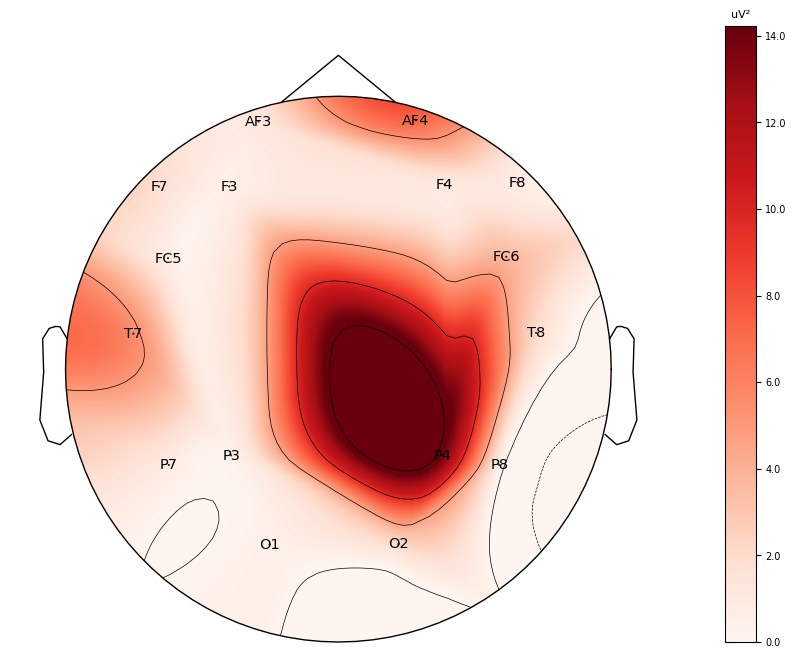

In [ ]:
fig, axs = plt.subplots(1,1,figsize=(15,8))
plt.rc('font', size=15)

im,cm = mne.viz.plot_topomap(eeg_power,information,extrapolate='head',axes=axs,names=signal_channels, contours=5, show=False)

# Aqui é só para criar uma barra de cor para indicar a escala de potência
# conforme a "temperatura" da cor
clb = fig.colorbar(im, format="%.1f")
clb.ax.tick_params(labelsize=7)
clb.ax.set_title("uV²",fontsize=8)

plt.show()

# Salvar o plot como imagem JPG
#fig.savefig('plot.jpg', format='jpg')

### Plot Sensors:

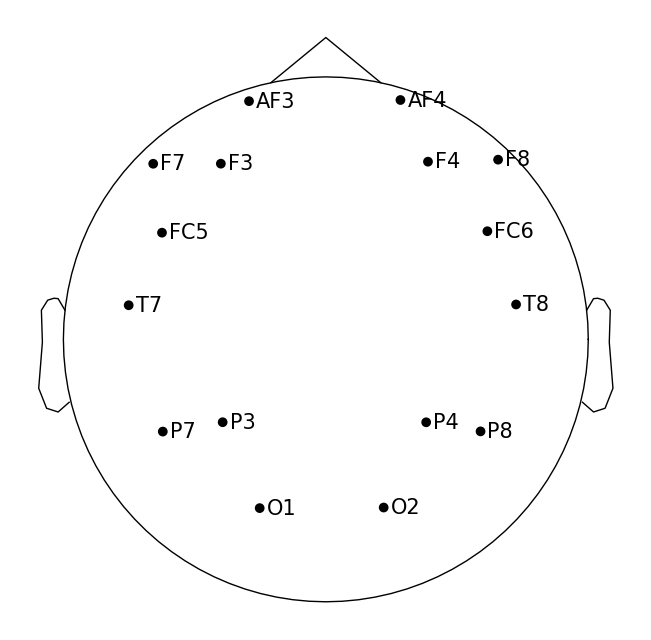

In [ ]:
fig= data.plot_sensors(show_names=True)

### plot:

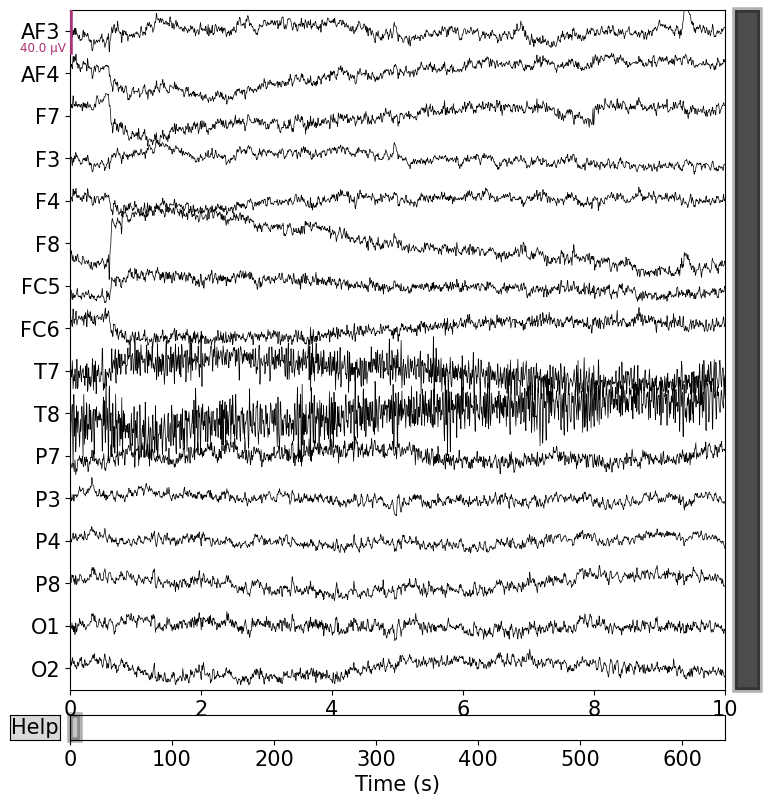

In [ ]:
fig = data.plot()

### PSD:

Effective window size : 4.000 (s)


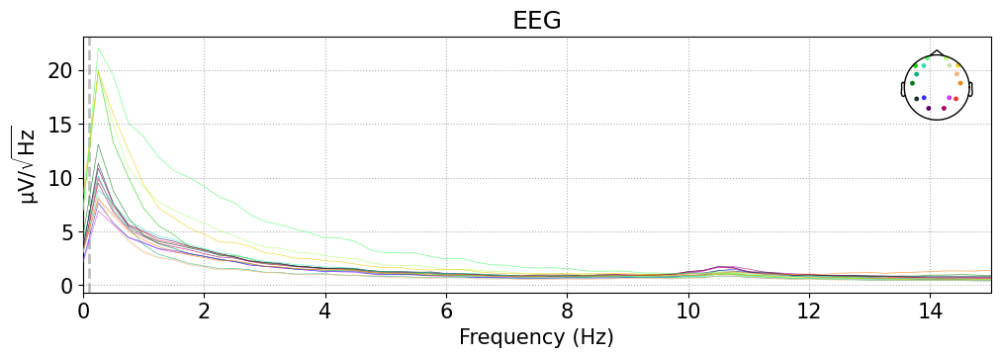

In [ ]:
ax = data.compute_psd(fmax=15).plot(picks=list(range(16)), dB =False)

In [ ]:
stim = {'start_exp':0, 'N_back1':1, 'N_back2':2, 'N_back3':3}

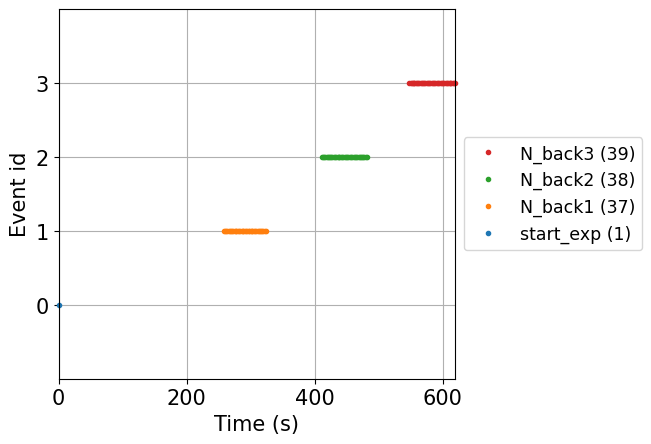

In [ ]:
fig = mne.viz.plot_events(event_mne, event_id=stim, sfreq=data.info['sfreq'],
                          first_samp=data.first_samp)

In [ ]:
epochs_mne = mne.Epochs(data, event_mne, event_id=stim, tmax=2, preload=False)

Not setting metadata
115 matching events found
Setting baseline interval to [-0.19921875, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


In [ ]:
event_focus = ["N_back1", "N_back2"]
epochs_mne.equalize_event_counts(event_focus)
ptc_back1 = epochs_mne["N_back1"]
ptc_back2 = epochs_mne["N_back2"]

Using data from preloaded Raw for 115 events and 1127 original time points ...
1 bad epochs dropped
Dropped 1 epoch: 74


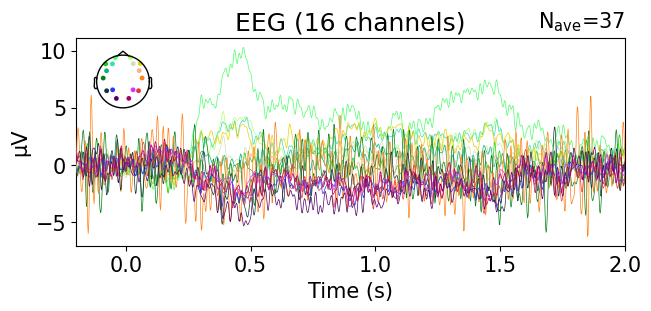

Using data from preloaded Raw for 37 events and 1127 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


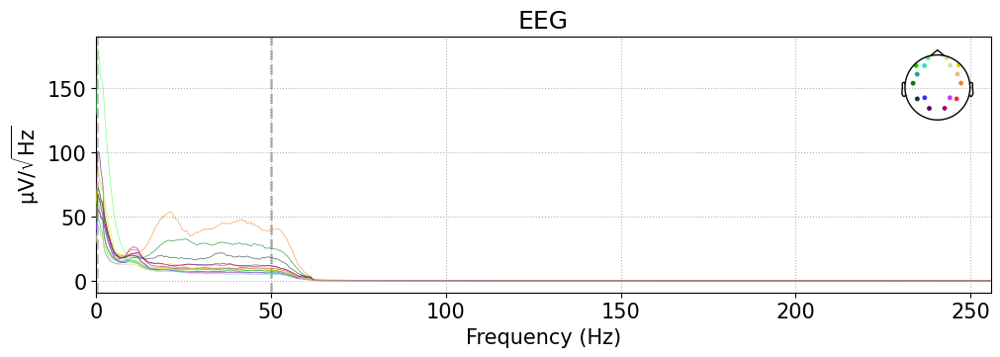

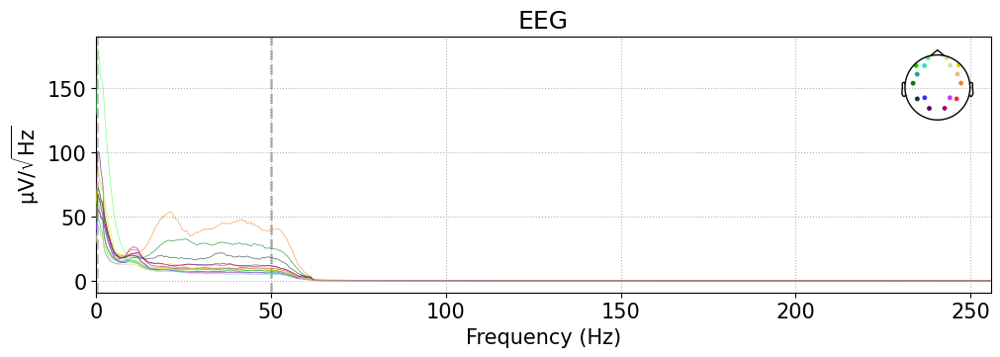

In [ ]:
ptc_back1.average().plot()
ptc_back1.compute_psd().plot(dB=False)

Lembrando que é o valor + 1

[  1,   5,   8,  10,  14,  16,  19,  21,  24,  28,  31,  34]

[  39,  42, 44,  47,  48,  51,  55,  59,  62,  66,  69,  72]

[ 78,  79,  80,  86, 87,  91,  94,  99, 104, 106, 110, 111]

Using data from preloaded Raw for 37 events and 1127 original time points ...
Not setting metadata
37 matching events found
No baseline correction applied
0 projection items activated
combining channels using "gfp"


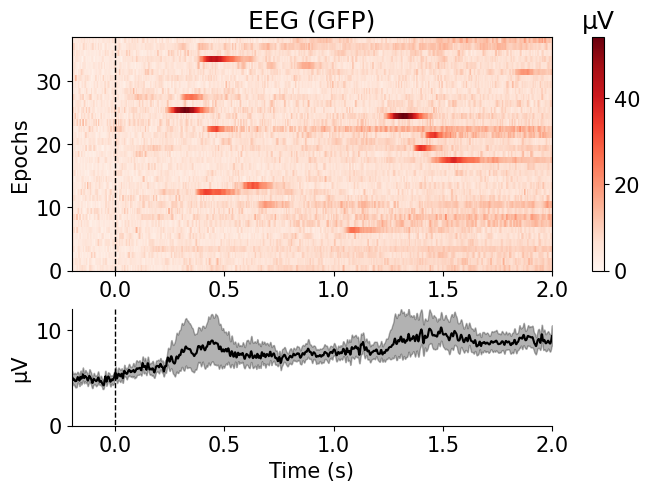

[<Figure size 640x480 with 3 Axes>]

In [ ]:
ptc_back1.plot_image()

Using data from preloaded Raw for 37 events and 1127 original time points ...
Not setting metadata
37 matching events found
No baseline correction applied
0 projection items activated
combining channels using "gfp"


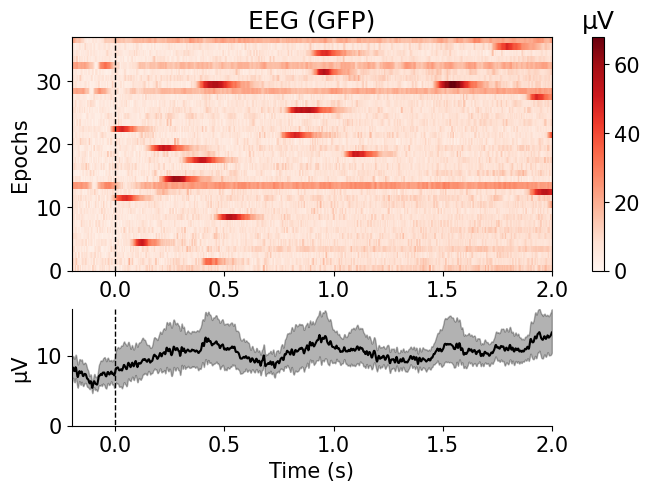

[<Figure size 640x480 with 3 Axes>]

In [ ]:
ptc_back2.plot_image()

Using data from preloaded Raw for 37 events and 1127 original time points ...
No baseline correction applied


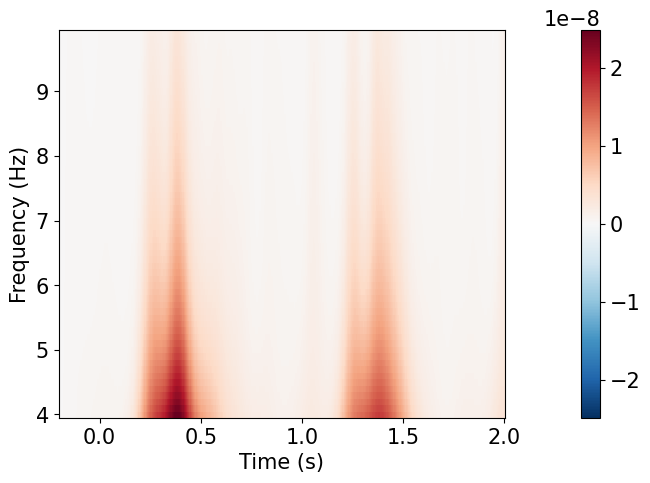

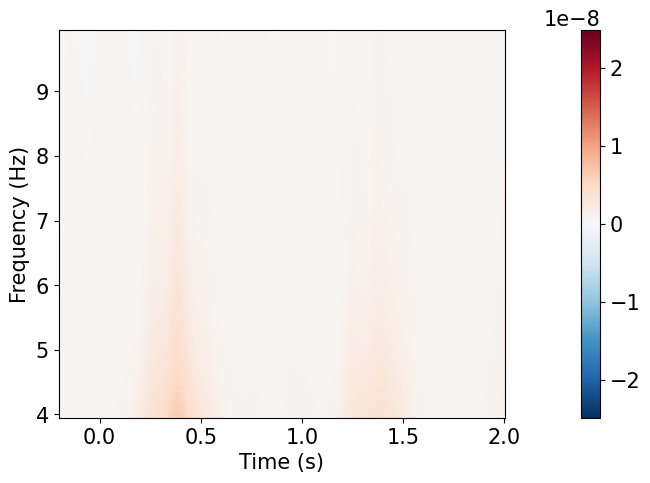

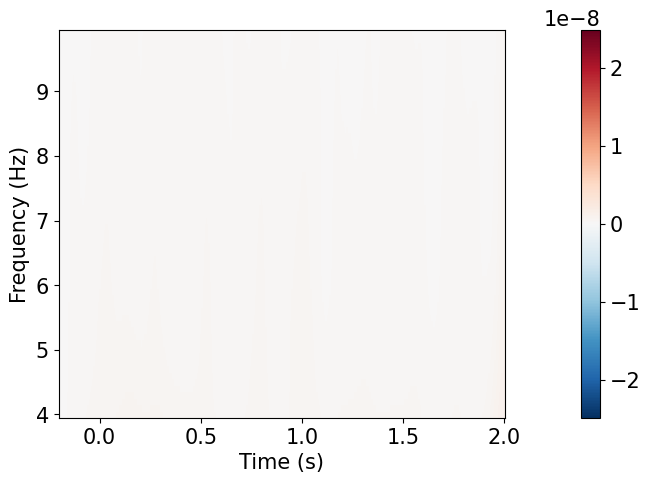

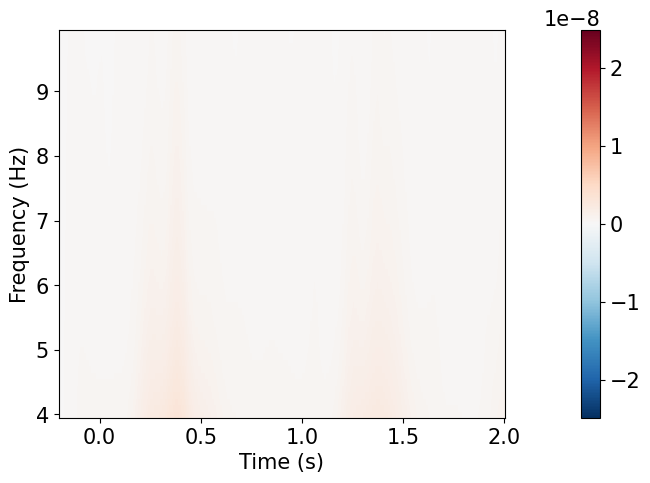

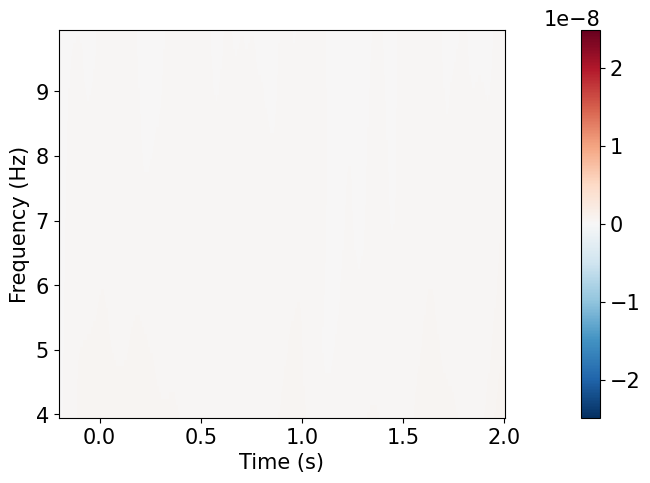

...

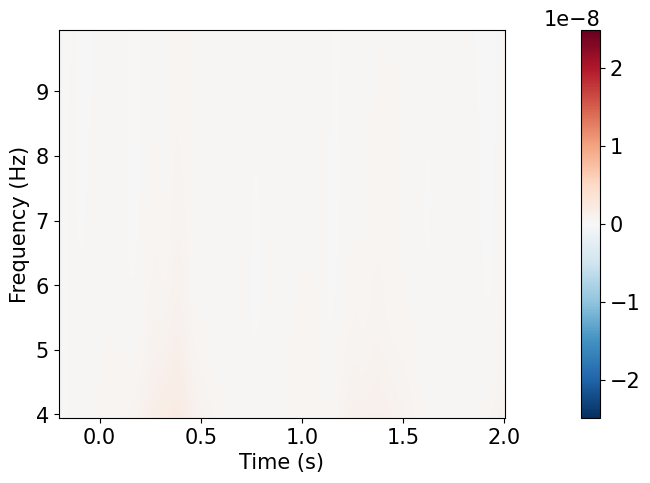

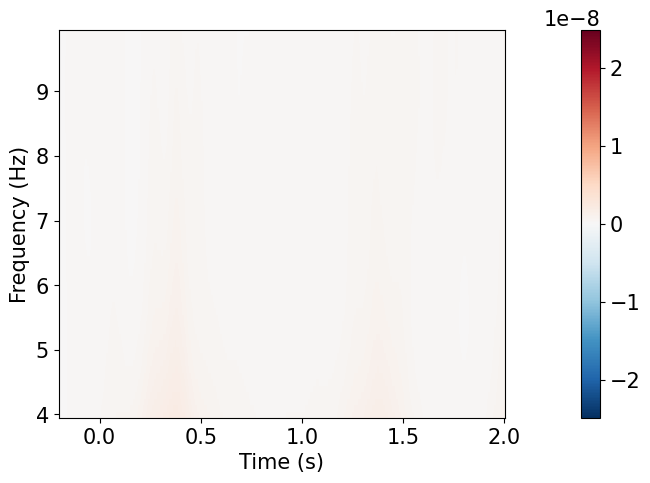

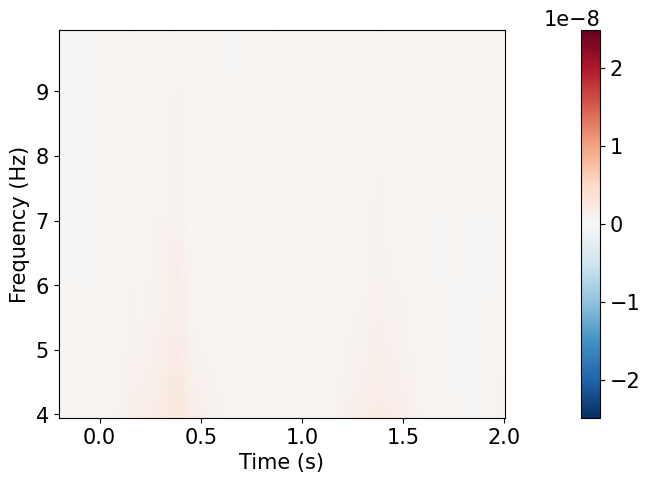

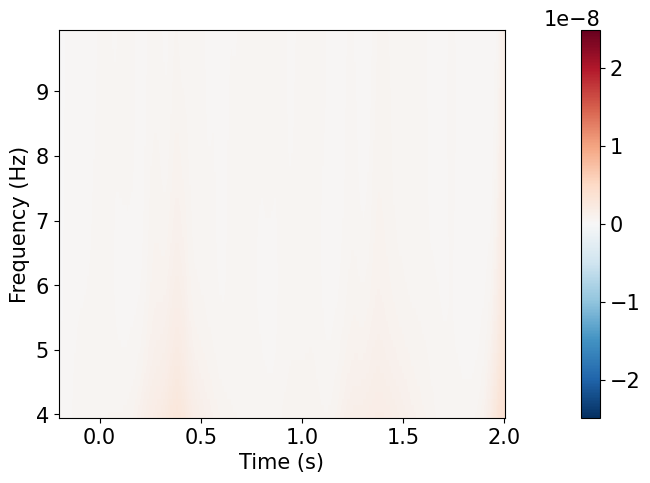

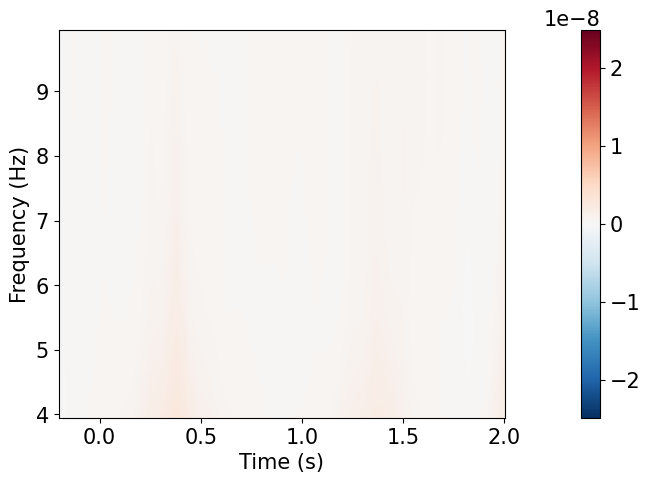

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
# frequencies = np.arange(4, 10, 0.1)
# power = mne.time_frequency.tfr_morlet(ptc_back1, n_cycles=2, return_itc=False,freqs=frequencies, decim=3)
# power.plot()

Using data from preloaded Raw for 37 events and 1127 original time points ...
No baseline correction applied


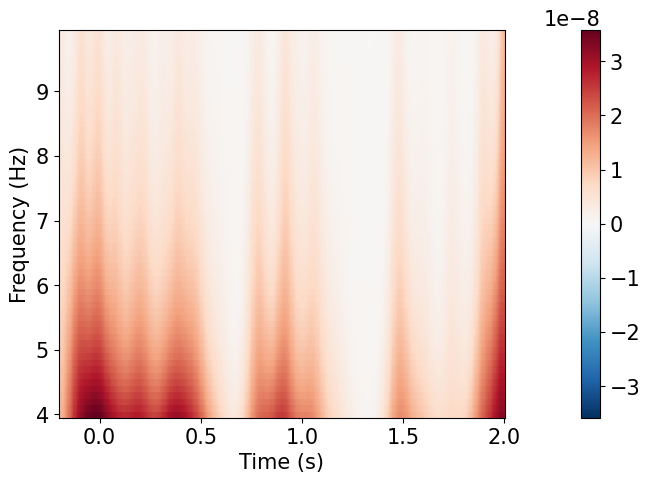

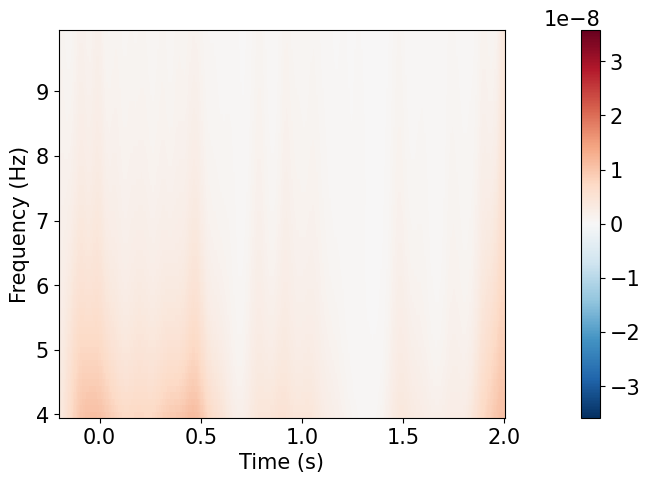

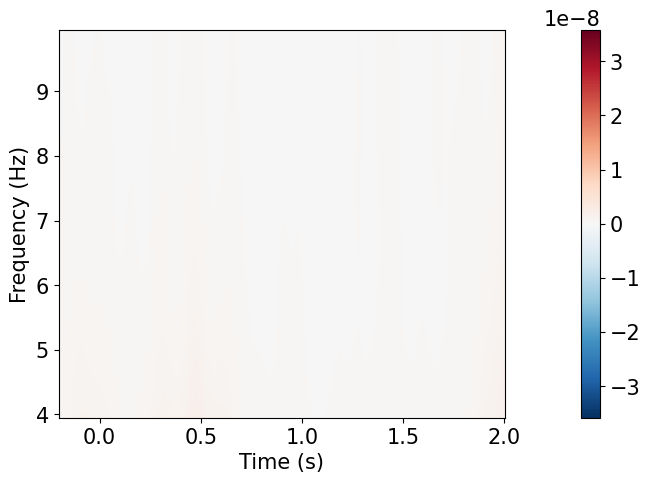

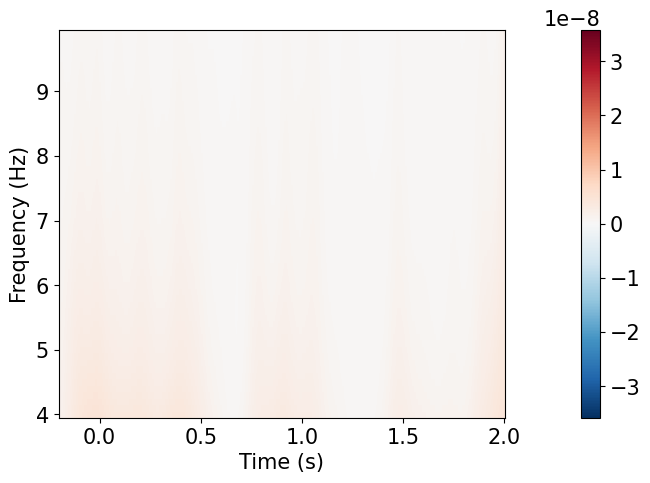

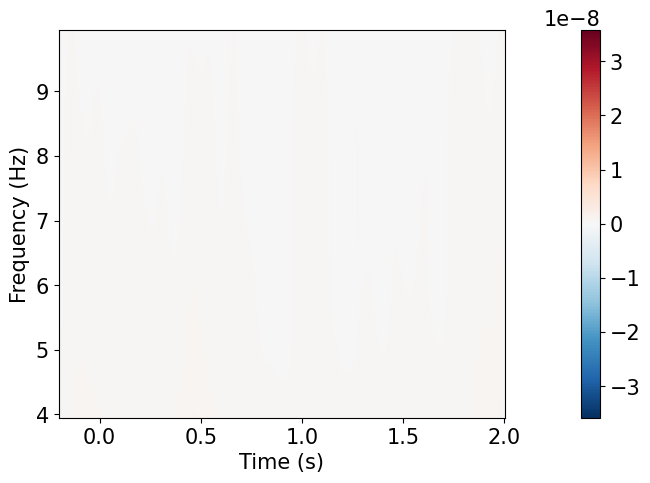

...

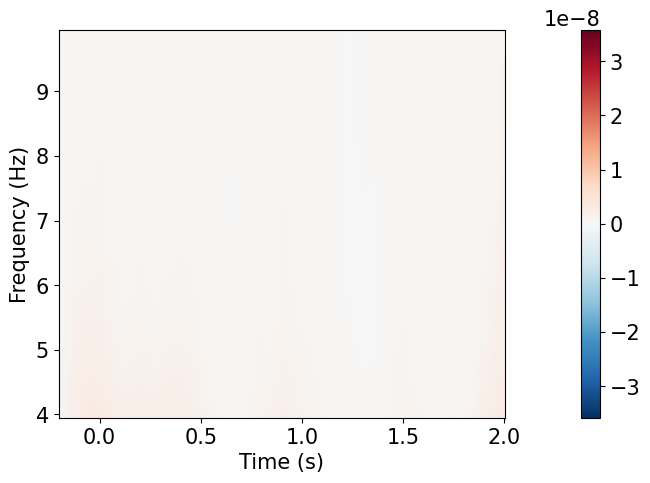

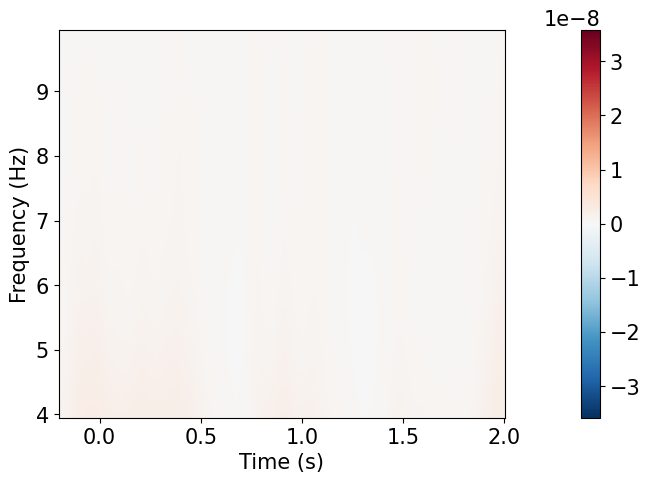

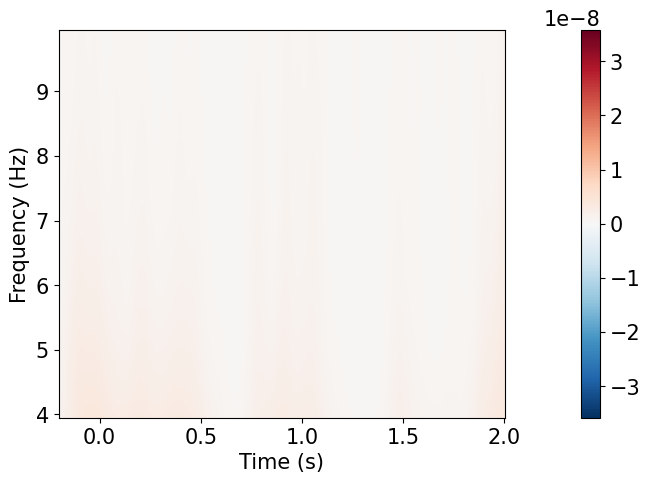

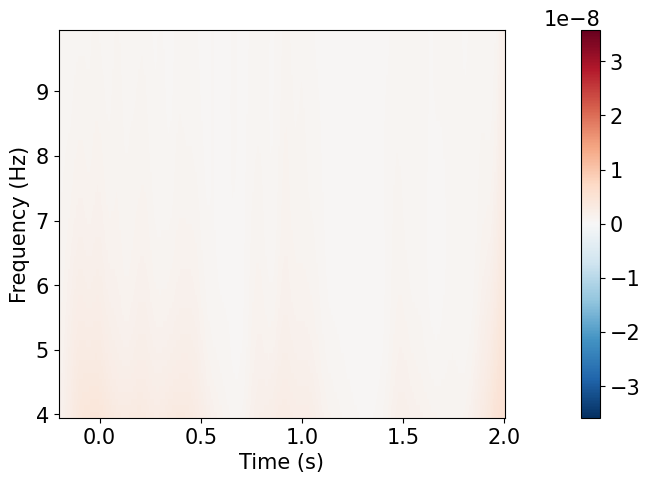

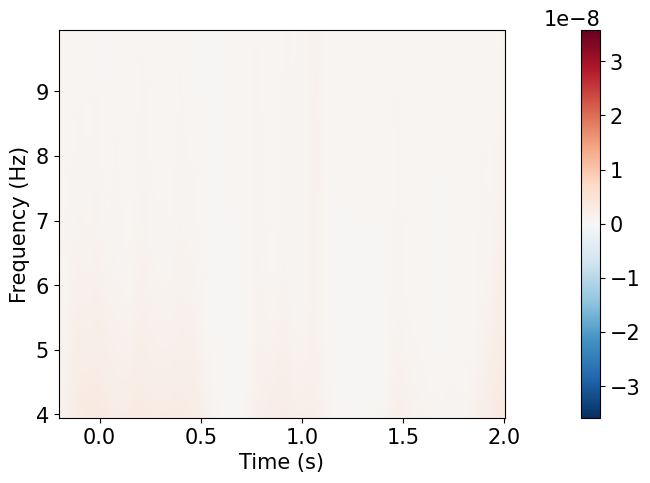

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
# frequencies = np.arange(4, 10, 0.1)
# power = mne.time_frequency.tfr_morlet(ptc_back2, n_cycles=2, return_itc=False,freqs=frequencies, decim=3)
# power.plot()

In [ ]:
ptc_evoked_1 = ptc_back1.average()
ptc_evoked_2 = ptc_back2.average()

combining channels using "gfp"


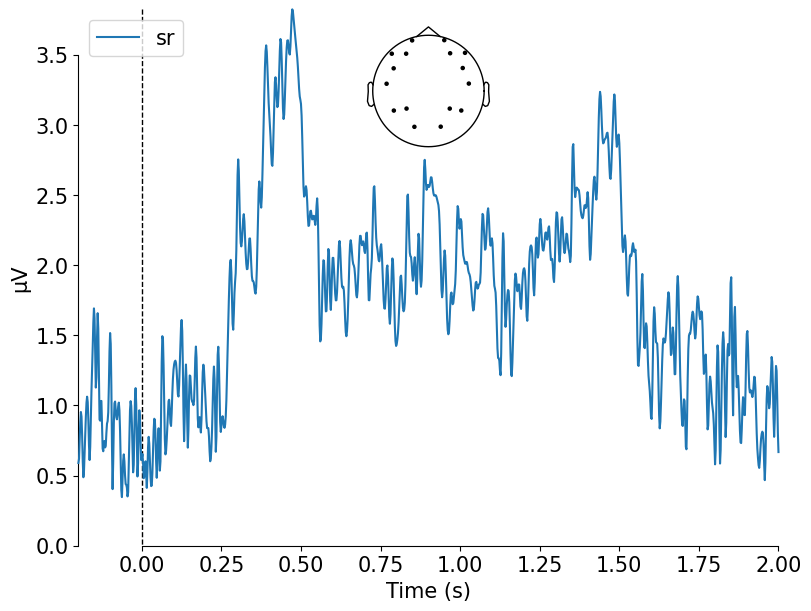

[<Figure size 800x600 with 2 Axes>]

In [ ]:
# mne.viz.plot_compare_evokeds(dict(sr=ptc_evoked_1),legend='upper left', show_sensors='upper center')

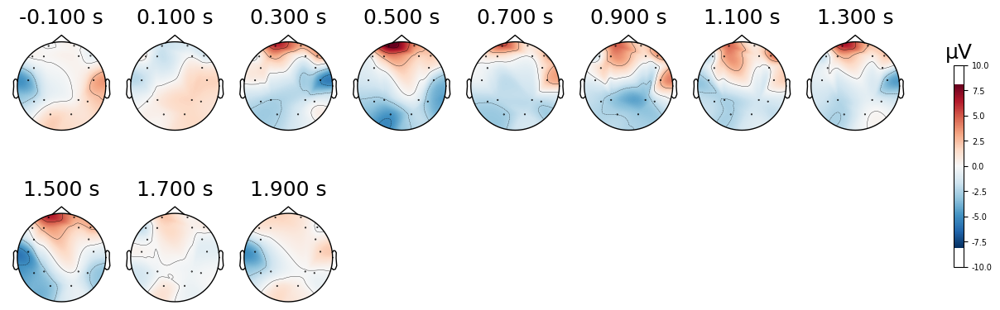

In [ ]:
all_times = np.arange(-0.1, 2, 0.2)
fig = ptc_evoked_1.plot_topomap(all_times, ch_type="eeg", ncols=8, nrows="auto")

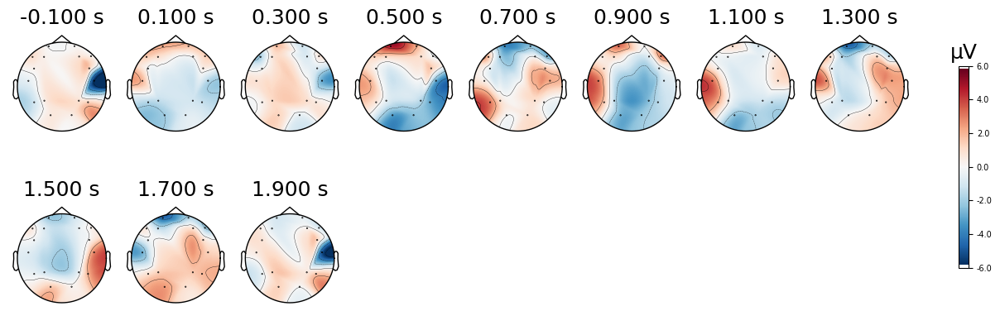

In [ ]:
fig = ptc_evoked_2.plot_topomap(all_times, ch_type="eeg", ncols=8, nrows="auto")

combining channels using "gfp"
combining channels using "gfp"


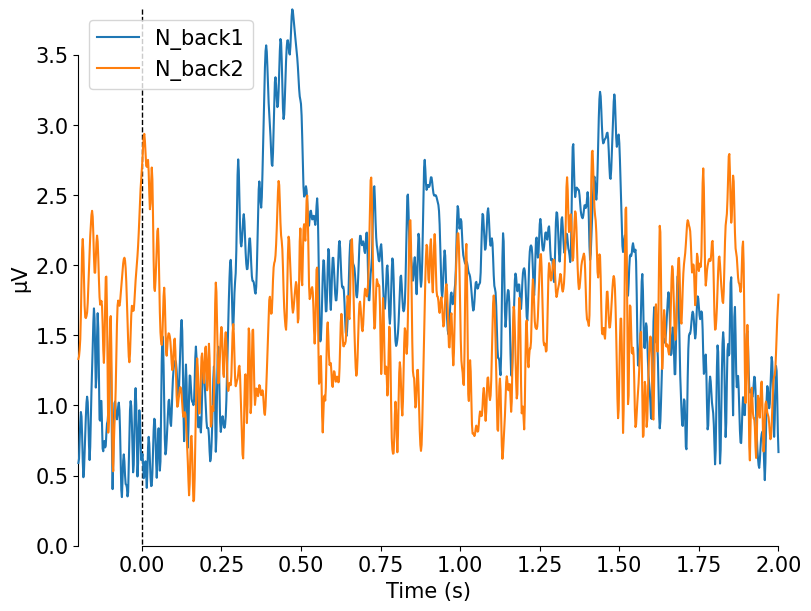

[<Figure size 800x600 with 1 Axes>]

In [ ]:
mne.viz.plot_compare_evokeds(evokeds=[ptc_evoked_1, ptc_evoked_2])

In [ ]:
# Extrair os dados dos evoked potentials
data_1 = ptc_evoked_1.data.flatten()  # Flatten para transformar em um array 1D
data_2 = ptc_evoked_2.data.flatten()

# Calcular a correlação cruzada
cross_corr = np.correlate(data_1, data_2, mode='same')

# Normalizar a correlação cruzada entre -1 e 1
norm_cross_corr = cross_corr / (np.linalg.norm(data_1) * np.linalg.norm(data_2))

# Calcular o atraso de tempo associado ao pico de correlação
peak_delay = np.argmax(norm_cross_corr) - len(norm_cross_corr) // 2  # Ajustar para o centro do array

# Calcular a correlação máxima
max_corr = np.max(norm_cross_corr)

print(f"Correlação Cruzada Máxima: {max_corr}")
print(f"Atraso de Tempo do Pico de Correlação: {peak_delay} amostras")

Correlação Cruzada Máxima: 0.17767847780175297
Atraso de Tempo do Pico de Correlação: 229 amostras


Using data from preloaded Raw for 37 events and 1127 original time points ...


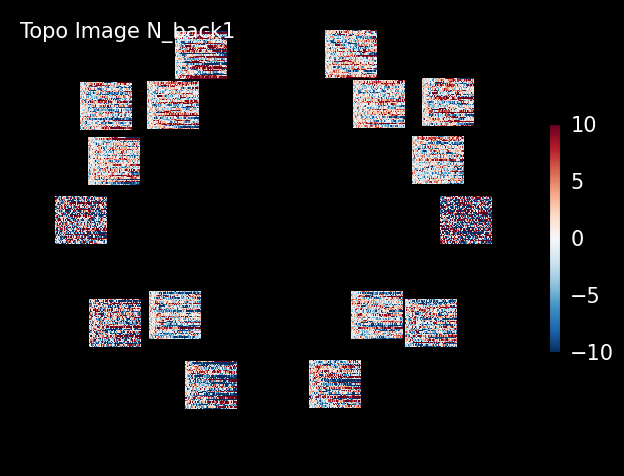

Using data from preloaded Raw for 37 events and 1127 original time points ...


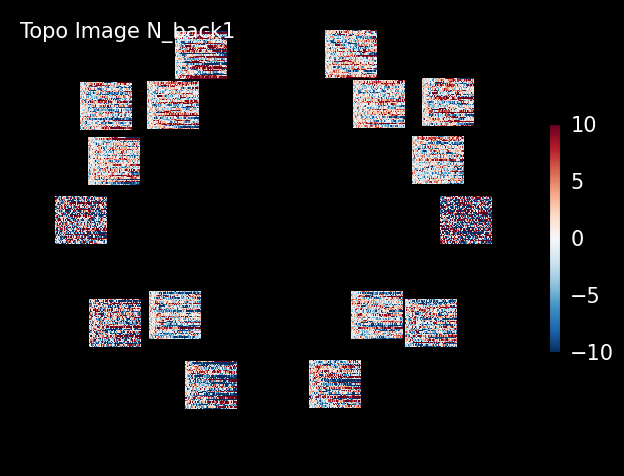

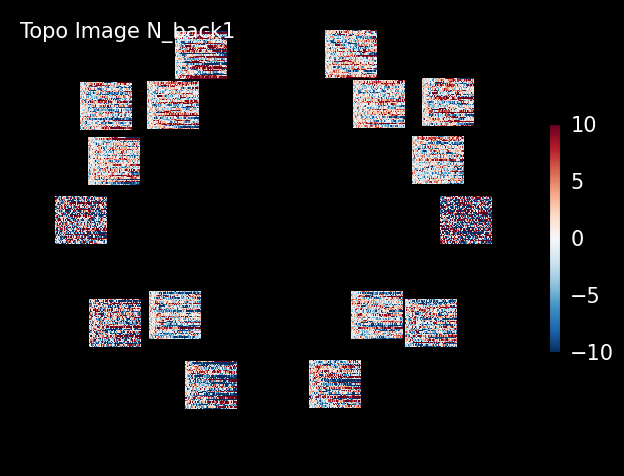

In [ ]:
ptc_back1.plot_topo_image(title='Topo Image N_back1', colorbar=True, vmin=-10, vmax=10)
ptc_back1.plot_topo_image(title='Topo Image N_back1', colorbar=True, vmin=-10, vmax=10)

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Using data from preloaded Raw for 37 events and 1127 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


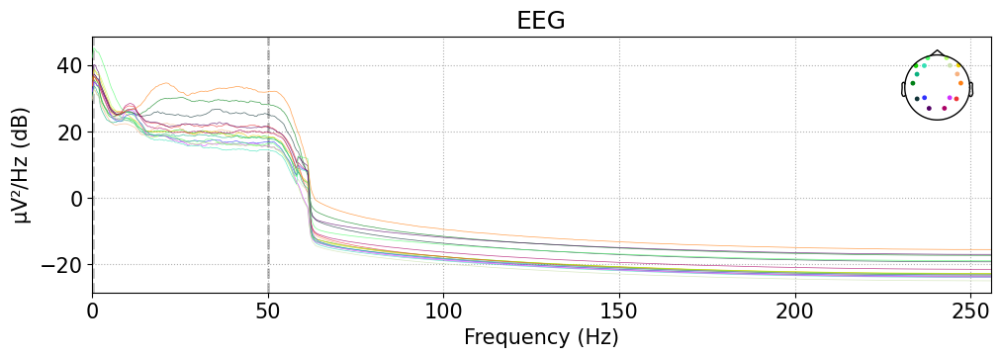

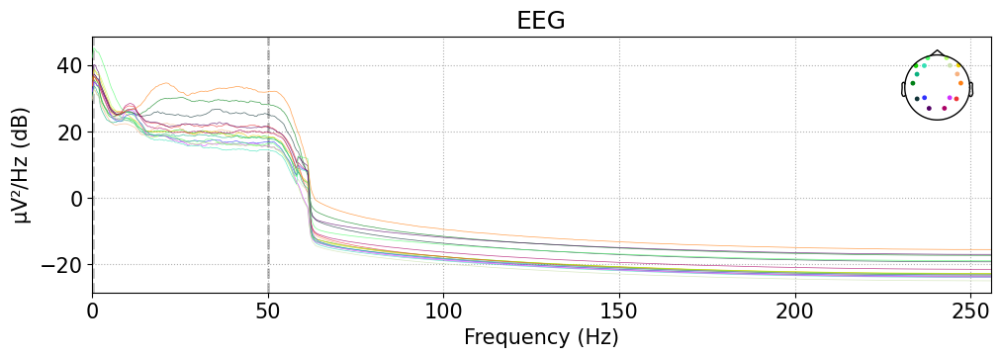

In [ ]:
ptc_back1.plot_psd()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Using data from preloaded Raw for 37 events and 1127 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


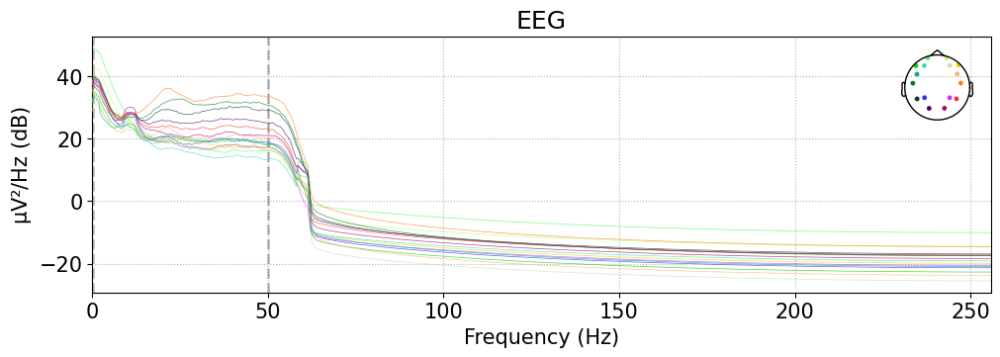

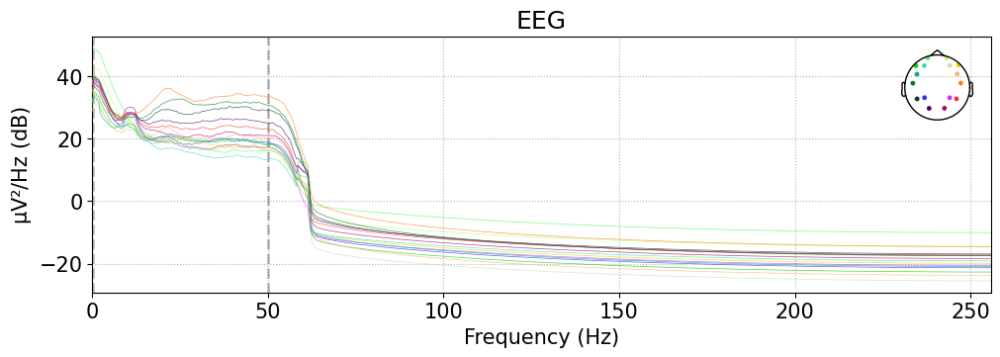

In [ ]:
ptc_back2.plot_psd()